<h1>CLUSTERING</h1>

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
plt.style.use("fast")
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import plotly.subplots as sp
from plotly.subplots import make_subplots
import plotly.graph_objs as go

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import mean_absolute_error, silhouette_score
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist, squareform
from scipy.stats import norm
from scipy.spatial import distance
from scipy.spatial.distance import cdist
from scipy.stats import pearsonr
from sklearn.metrics import pairwise_distances

import random
import statistics

!pip install -q kneed
from kneed import KneeLocator

from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [2]:
data = pd.read_csv('df_train.csv',  skipinitialspace=True)

In [3]:
data.head()

,rating,startYear,runtimeMinutes,awardWins,totalImages,totalVideos,totalCredits,criticReviewsTotal,titleType,awardNominationsExcludeWins,canHaveEpisodes,isAdult,numRegions,userReviewsTotal,ratingCount,countryOfOrigin,genres
0,8,1995,58,0,1,0,21,1,1,0,0,0,1,0,781,['US'],"Action,Adventure,Animation"
1,6,1982,58,0,1,0,1,0,2,0,0,0,1,0,11,['XWG'],Action
2,6,1992,58,0,1,0,24,0,3,0,0,0,1,1,38,['RU'],Comedy
3,6,2021,58,0,22,0,56,0,4,0,1,0,1,0,15,['MX'],Reality-TV
4,8,2020,80,1,347,2,47,4,4,1,1,0,32,452,15746,['KR'],"Comedy,Drama,Romance"


In [4]:
df = data.drop(columns=['countryOfOrigin', 'genres','rating','titleType','canHaveEpisodes','isAdult']).copy()

In [5]:
X = df.values

In [6]:
df.head()

,startYear,runtimeMinutes,awardWins,totalImages,totalVideos,totalCredits,criticReviewsTotal,awardNominationsExcludeWins,numRegions,userReviewsTotal,ratingCount
0,1995,58,0,1,0,21,1,0,1,0,781
1,1982,58,0,1,0,1,0,0,1,0,11
2,1992,58,0,1,0,24,0,0,1,1,38
3,2021,58,0,22,0,56,0,0,1,0,15
4,2020,80,1,347,2,47,4,1,32,452,15746


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16416 entries, 0 to 16415
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   startYear                    16416 non-null  int64
 1   runtimeMinutes               16416 non-null  int64
 2   awardWins                    16416 non-null  int64
 3   totalImages                  16416 non-null  int64
 4   totalVideos                  16416 non-null  int64
 5   totalCredits                 16416 non-null  int64
 6   criticReviewsTotal           16416 non-null  int64
 7   awardNominationsExcludeWins  16416 non-null  int64
 8   numRegions                   16416 non-null  int64
 9   userReviewsTotal             16416 non-null  int64
 10  ratingCount                  16416 non-null  int64
dtypes: int64(11)
memory usage: 1.4 MB


<h1>NORMALIZZAZIONE</h1>

In [8]:
# z-score, fit and then transform
scaler = StandardScaler()
scaler.fit(X)
X_scal = scaler.transform(X)

In [9]:
# min-max, fit and trasform directly
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(X)

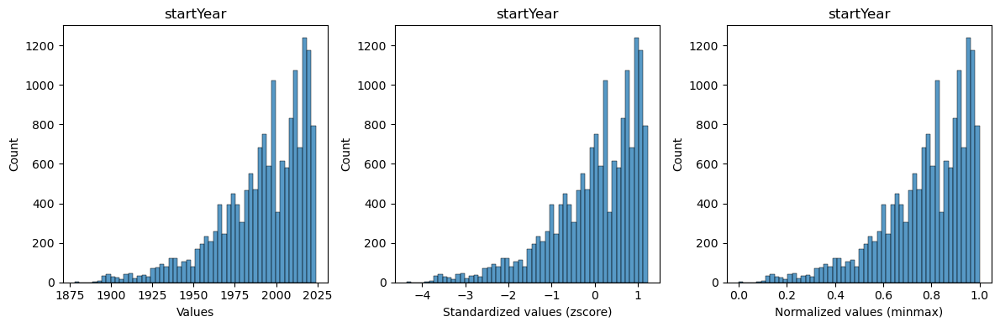

In [10]:
i = 0 # column index
fig, axs = plt.subplots(1,3, figsize=(12, 4)) # 1 row, 3 columns

sns.histplot(X[:,i], ax=axs[0]).set(title=df.columns[i])
axs[0].set(xlabel='Values')

sns.histplot(X_scal[:,i], ax=axs[1]).set(title=df.columns[i])
axs[1].set(xlabel='Standardized values (zscore)')

sns.histplot(X_minmax[:,i], ax=axs[2]).set(title=df.columns[i])
axs[2].set(xlabel='Normalized values (minmax)')

plt.tight_layout() # Adjust the padding between and around subplots

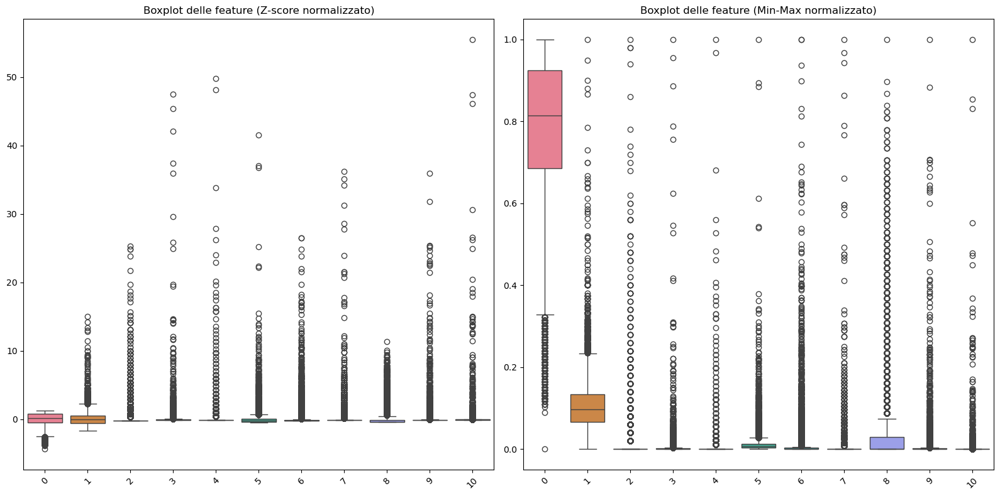

In [12]:
# Se X_scal e X_minmax sono numpy arrays, possiamo convertirli in DataFrame per una migliore gestione
# e per usare facilmente seaborn per i boxplot (se sono già pandas DataFrame, puoi saltare questo passaggio)
X_scal_df = pd.DataFrame(X_scal)
X_minmax_df = pd.DataFrame(X_minmax)

# Configura la visualizzazione dei boxplot
plt.figure(figsize=(16, 8))

# Boxplot per X_scal (normalizzazione Z-score)
plt.subplot(1, 2, 1)
sns.boxplot(data=X_scal_df)
plt.title('Boxplot delle feature (Z-score normalizzato)')
plt.xticks(rotation=45)

# Boxplot per X_minmax (normalizzazione Min-Max)
plt.subplot(1, 2, 2)
sns.boxplot(data=X_minmax_df)
plt.title('Boxplot delle feature (Min-Max normalizzato)')
plt.xticks(rotation=45)

# Mostra il grafico
plt.tight_layout()
plt.show()

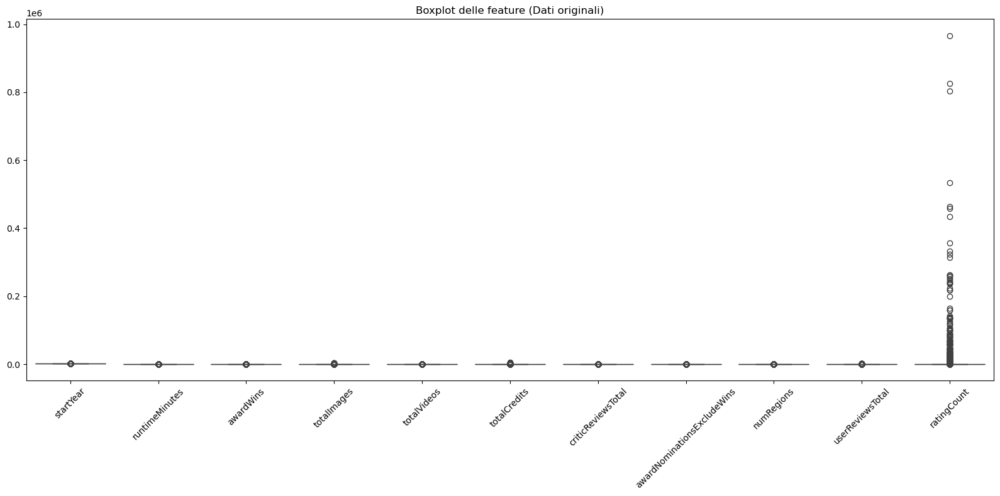

In [13]:
# Configura la visualizzazione dei boxplot
plt.figure(figsize=(16, 8))

# Boxplot per i dati nel DataFrame 'df'
sns.boxplot(data=df)

# Aggiungi titolo e ruota le etichette delle colonne (se necessario)
plt.title('Boxplot delle feature (Dati originali)')
plt.xticks(rotation=45)

# Mostra il grafico
plt.tight_layout()
plt.show()

<h1> K-MEANS </h1>

In [11]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np

def sse_elbow(dataframe, max_clusters):
  # A list holds the SSE values for each k
  sse = []
  for k in range(1, max_clusters+1):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100, random_state=42)
    kmeans.fit(dataframe)
    sse.append(kmeans.inertia_)

  # Find the elbow point
  kl = KneeLocator(range(1, max_clusters+1), sse, curve="convex", direction="decreasing")
  elbow_point = kl.elbow

  plt.plot(range(1, max_clusters+1), sse)
  plt.xticks(range(1, max_clusters+1))
  plt.xlabel("Number of Clusters")
  plt.ylabel("SSE")

  # Add a vertical line at the elbow point
  plt.axvline(x=elbow_point, color='r', linestyle='--')

  plt.show()
    
  


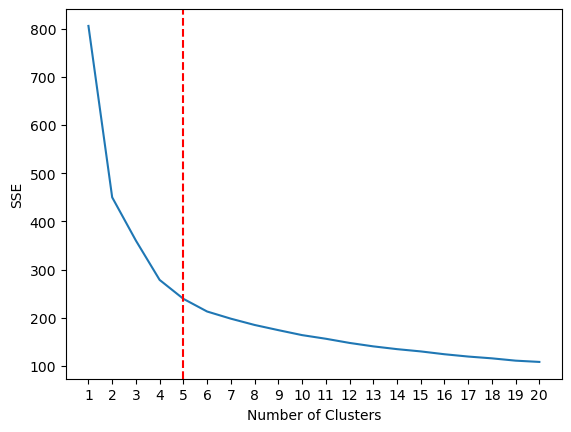

In [12]:
'''
------------- ELBOW METHOD -------------
To perform the elbow method, run several
k-means, increment k with each iteration
and record the SSE.
----------------------------------------
'''


sse_elbow(X_minmax, 20)

In [13]:
#Il grafico cambia in base a se usiamo minmax o se usiamo zscore

In [14]:
def sil_k_choice(dataframe, max_clusters):
  sil_list = []
  dist = squareform(pdist(dataframe)) # using a precomputed distance matrix

  for k in range(2, max_clusters+1):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100, random_state=42)
    kmeans.fit(dataframe)
    sil_list.append(silhouette_score(dist, kmeans.labels_, metric='precomputed'))

  # Find the second highest peak
  sorted_sil_list = sorted([(value, index) for index, value in enumerate(sil_list)], reverse=True)
  second_peak = sorted_sil_list[1][1] if len(sorted_sil_list) > 1 else None

  plt.plot(range(2, max_clusters+1), sil_list)
  plt.xticks(range(2, max_clusters+1))
  plt.xlabel("Number of Clusters")
  plt.ylabel("Silhouette Coefficient")

  '''# Add a vertical line at the second highest peak
  if second_peak is not None:
    plt.axvline(x=second_peak+2, color='r', linestyle='--')'''

  plt.show()

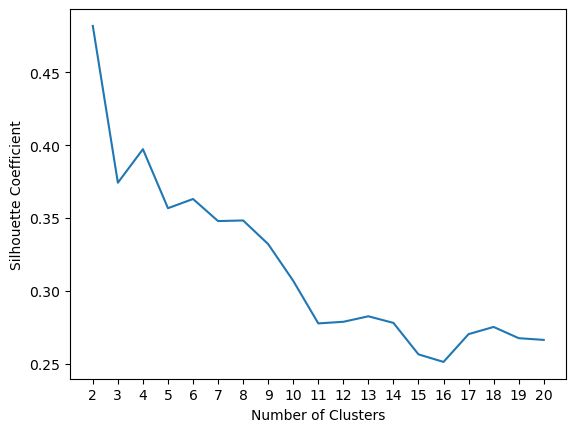

In [15]:

'''
-------- SILHOUETTE SCORE METHOD -------
The silhouette coefficient is a measure of cluster cohesion and separation. It quantifies
how well a data point fits into its assigned cluster based on two factors:

- How close the data point is to other points in the cluster
- How far away the data point is from points in other clusters Silhouette coefficient values range between -1 and 1.
Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In the scikit-learn implementation of the silhouette coefficient, the average silhouette
coefficient of all the samples is summarized into one score. The silhouette score() function
needs a minimum of two clusters, or it will raise an exception.
'''



sil_k_choice(X_minmax, 20)

In [16]:
kmeans = KMeans(n_clusters=6, n_init=30, max_iter=300, random_state=94)
kmeans.fit(X_minmax)

KMeans(n_clusters=6, n_init=30, random_state=94)

In [17]:
#Anche questo da modificare in base alla normalizzazione che usiamo

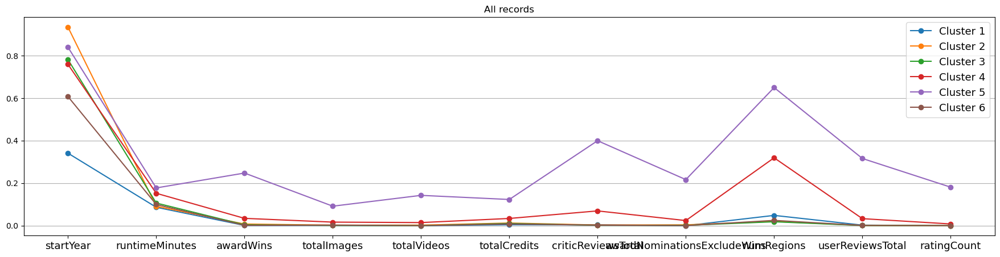

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

def cluster_distances_plot(data, kmeans, title, column_names=None):
    clust_name = [str(i) for i in range(1, kmeans.n_clusters + 1)]
    centers = kmeans.cluster_centers_

    # Se column_names non è passato, usa i nomi di colonna di `data` (assumendo che data sia un DataFrame pandas)
    if column_names is not None:
        data = pd.DataFrame(data, columns=column_names)
    else:
        # Se `data` è un numpy.ndarray e non un DataFrame, dovresti passare manualmente i nomi delle colonne
        data = pd.DataFrame(data, columns=[f'Feature {i}' for i in range(data.shape[1])])

    # Aggiungi le etichette del cluster come colonna
    data = data.assign(kmeans_labels=kmeans.labels_)

    cluster_sizes = data['kmeans_labels'].value_counts()

    plt.figure(figsize=(22, 5))
    for i in range(len(centers)):
        plt.plot(centers[i], marker='o', label='Cluster ' + clust_name[i])

    # Usa i nomi delle colonne originali (escludendo kmeans_labels)
    plt.xticks(range(len(data.columns) - 1), data.columns[:-1], fontsize=13)  # Escludi 'kmeans_labels' dal grafico
    plt.legend(fontsize=13, loc='best')
    plt.title(title)
    plt.grid(axis='y')
    plt.show()

# Esegui la funzione con il tuo clustering KMeans
cluster_distances_plot(data=X_scal, kmeans=kmeans, title="All records", column_names=df.columns)


In [19]:
kmeans.labels_

array([2, 2, 2, ..., 1, 3, 1], dtype=int32)

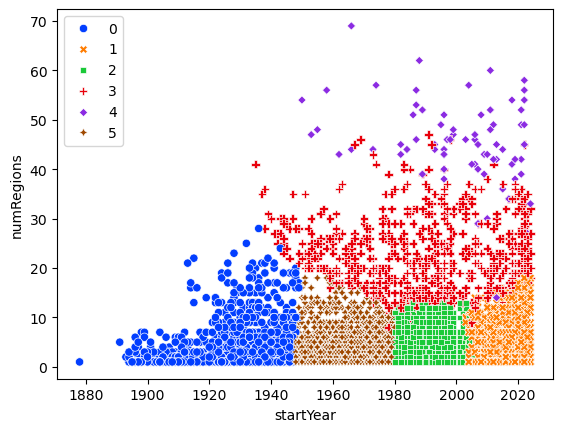

In [20]:
sns.scatterplot(data=df, 
                x="startYear",
                y="numRegions",
                hue=kmeans.labels_,
                style=kmeans.labels_,
                palette="bright")
plt.show()

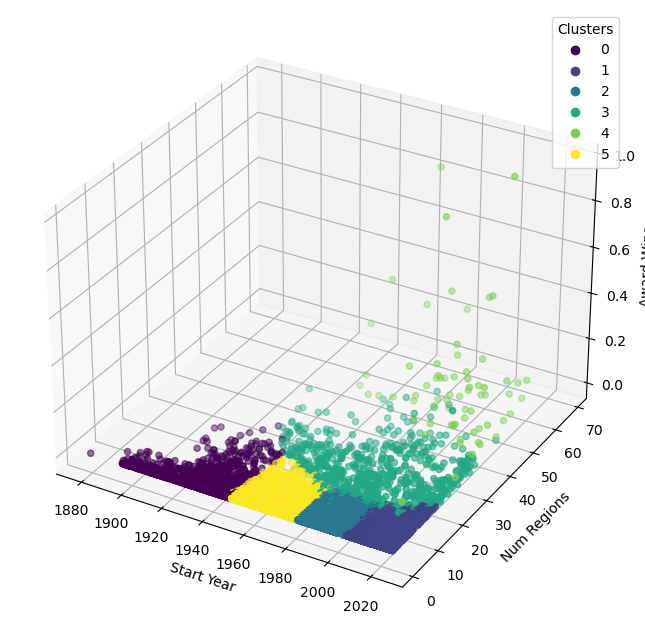

In [21]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Crea una figura e un oggetto 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Crea il grafico a dispersione 3D
scatter = ax.scatter(df['startYear'], df['numRegions'], df['ratingCount'], c=kmeans.labels_, cmap='viridis')  # Usa una colormap valida

# Aggiungi etichette agli assi
ax.set_xlabel('Start Year')
ax.set_ylabel('Num Regions')
ax.set_zlabel('Award Wins')  # Assicurati che il nome dell'asse Z corrisponda alla variabile che stai utilizzando

# Mostra la legenda
plt.legend(*scatter.legend_elements(), title="Clusters")

# Mostra il grafico
plt.show()


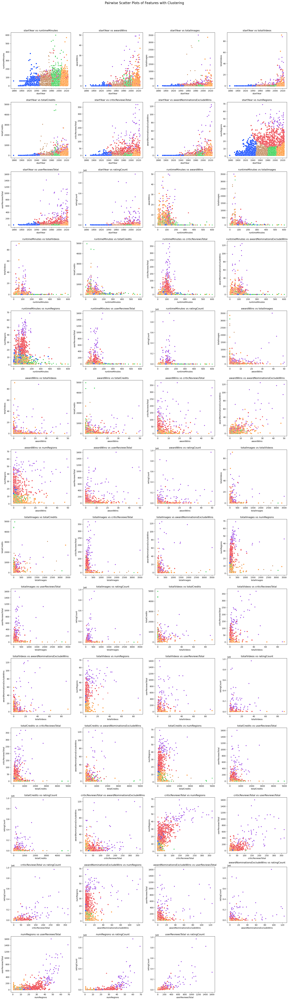

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

def plot_pairwise_clusters(df, kmeans, columns, ncols=4, palette="bright"):
    """
    Funzione per creare scatter plot per ogni coppia di variabili del DataFrame e disporli in subplots.
    
    Parameters:
    - df: DataFrame con i dati
    - kmeans: modello KMeans con etichette dei cluster
    - columns: lista delle colonne del DataFrame da usare per il grafico
    - ncols: numero di colonne nel layout di subplots
    - palette: palette dei colori per i grafici (default è "bright")
    """
    # Ottieni tutte le combinazioni di colonne
    column_combinations = list(itertools.combinations(columns, 2))

    # Calcola il numero di righe necessarie per i subplots
    nrows = (len(column_combinations) + ncols - 1) // ncols

    # Imposta il layout dei subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5 * nrows))
    axes = axes.flatten()  # Appiattisci l'array di axes per facilitare l'accesso

    # Crea i grafici
    for i, (x_col, y_col) in enumerate(column_combinations):
        sns.scatterplot(data=df, 
                        x=x_col, 
                        y=y_col, 
                        hue=kmeans.labels_, 
                        style=kmeans.labels_,
                        palette=palette, 
                        ax=axes[i])  # Passa l'asse specifico per il grafico
        axes[i].set_title(f'{x_col} vs {y_col}')
        axes[i].set_xlabel(x_col)
        axes[i].set_ylabel(y_col)
        axes[i].legend().set_visible(False)  # Disabilita la legenda per evitare sovrapposizioni

    # Rimuovi eventuali subplot vuoti
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Aggiungi un titolo generale al grafico
    plt.suptitle('Pairwise Scatter Plots of Features with Clustering', fontsize=16)

    # Regola il layout per evitare sovrapposizioni
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Aggiungi un margine per il titolo

    plt.show()

# Usa la funzione per creare i grafici con il tuo dataset
plot_pairwise_clusters(df, kmeans, df.columns, ncols=4)


In [146]:
print('SSE', kmeans.inertia_)
print('Silhouette', silhouette_score(X_scal, kmeans.labels_))

SSE 213.23020796758186
Silhouette 0.10584591577654703


In [147]:
print('SSE', kmeans.inertia_)
print('Silhouette', silhouette_score(X_minmax, kmeans.labels_))

SSE 213.23020796758186
Silhouette 0.3632459924112818


<h2>Come scegliere il numero di cluster?</h2>

In [27]:
%%time
sse_list = []

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=30, max_iter=300)
    kmeans.fit(X_minmax)
    sse_list.append(kmeans.inertia_)

CPU times: user 8min 14s, sys: 13min 31s, total: 21min 45s
Wall time: 2min 52s


In [28]:
%%time
sil_list = []

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=30, max_iter=300)
    kmeans.fit(X_minmax)
    sil_list.append(silhouette_score(X_minmax, kmeans.labels_))

CPU times: user 10min 38s, sys: 17min 43s, total: 28min 21s
Wall time: 4min 5s


In [29]:
%%time
sil_list = []
dist = squareform(pdist(X_minmax)) # using a precomputed distance matrix

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=30, max_iter=300)
    kmeans.fit(X_minmax)
    sil_list.append(silhouette_score(dist, kmeans.labels_, metric='precomputed'))

CPU times: user 9min 3s, sys: 14min 52s, total: 23min 55s
Wall time: 3min 30s


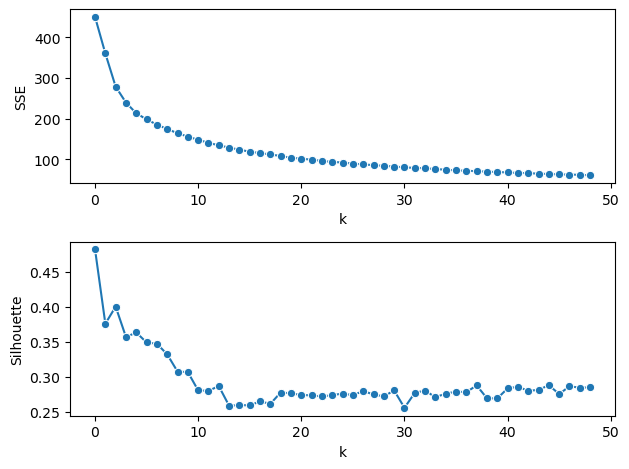

In [30]:
fig, axs = plt.subplots(2) 

sns.lineplot(x=range(len(sse_list)), y=sse_list, marker='o', ax=axs[0])
axs[0].set(xlabel='k', ylabel='SSE')

sns.lineplot(x=range(len(sil_list)), y=sil_list, marker='o', ax=axs[1])
axs[1].set(xlabel='k', ylabel='Silhouette')

plt.tight_layout() # Adjust the padding between and around subplots
plt.savefig('sse_sil.png', dpi=300, bbox_inches='tight')

<h3>Centro dei cluster</h3>

In [87]:

# ndarray of shape (n_clusters, n_features)
kmeans.cluster_centers_



array([[3.41124380e-01, 8.67504333e-02, 1.35181976e-03, 1.87950587e-03,
        2.09495877e-04, 4.71488847e-03, 4.02899179e-03, 2.30614413e-04,
        4.84886329e-02, 2.67636801e-03, 2.06604050e-04],
       [9.34168747e-01, 9.14689735e-02, 7.87851315e-03, 2.56374962e-03,
        2.77299008e-03, 1.26002262e-02, 3.31523382e-03, 4.03225806e-03,
        2.01411480e-02, 1.49652312e-03, 3.16849727e-04],
       [7.81525586e-01, 1.06626815e-01, 4.42553191e-03, 1.47985455e-03,
        3.49599742e-04, 1.07100328e-02, 1.94209506e-03, 1.64395202e-03,
        1.85559330e-02, 9.85504830e-04, 1.71915692e-04],
       [7.58929322e-01, 1.52517894e-01, 3.46012270e-02, 1.68724788e-02,
        1.47475224e-02, 3.40865212e-02, 6.95977261e-02, 2.41935484e-02,
        3.19424396e-01, 3.31466196e-02, 8.24328633e-03],
       [8.39557140e-01, 1.77694064e-01, 2.47671233e-01, 9.18167886e-02,
        1.42706608e-01, 1.23359291e-01, 3.99791543e-01, 2.16858153e-01,
        6.49879130e-01, 3.16178731e-01, 1.81317254e-

In [88]:

centers = scaler.inverse_transform(kmeans.cluster_centers_)
centers




array([[1.92780416e+03, 5.20502600e+01, 6.75909879e-02, 6.58578856e+00,
        1.90641248e-02, 2.34471404e+01, 1.48266898e+00, 2.85961872e-02,
        4.29722704e+00, 4.29289428e+00, 2.04793761e+02],
       [2.01438864e+03, 5.48813841e+01, 3.93925657e-01, 8.98337866e+00,
        2.52342097e-01, 6.26609248e+01, 1.22000604e+00, 5.00000000e-01,
        2.36959807e+00, 2.40042309e+00, 3.11405409e+02],
       [1.99210274e+03, 6.39760892e+01, 2.21276596e-01, 5.18541033e+00,
        3.18135765e-02, 5.32609929e+01, 7.14690983e-01, 2.03850051e-01,
        2.26180344e+00, 1.58074975e+00, 1.71248835e+02],
       [1.98880368e+03, 9.15107362e+01, 1.73006135e+00, 5.91211656e+01,
        1.34202454e+00, 1.69512270e+02, 2.56119632e+01, 3.00000000e+00,
        2.27208589e+01, 5.31671779e+01, 7.97656288e+03],
       [2.00057534e+03, 1.06616438e+02, 1.23835616e+01, 3.21726027e+02,
        1.29863014e+01, 6.13465753e+02, 1.47123288e+02, 2.68904110e+01,
        4.51917808e+01, 5.07150685e+02, 1.75345493e+

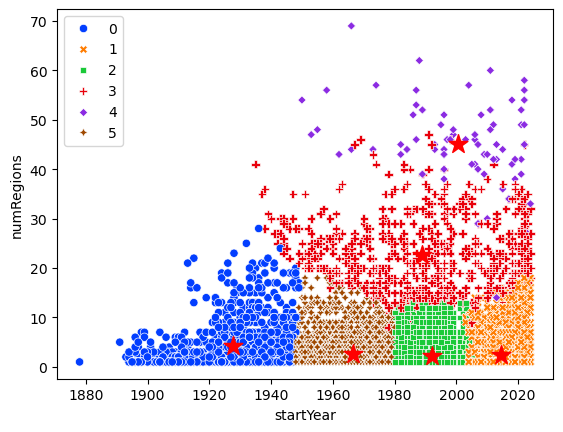

In [89]:

# Crea il grafico a dispersione
sns.scatterplot(data=df, 
                x="startYear",  # Colonna 0 per l'asse X
                y="numRegions",  # Colonna 11 per l'asse Y
                hue=kmeans.labels_,  # Usa le etichette numeriche per il colore
                style=kmeans.labels_,  # Usa le etichette numeriche per il marker style
                palette="bright")

# Aggiungi i centri dei cluster al grafico
# I centri dei cluster sono già scalati, quindi bisogna usare gli indici giusti per startYear (0) e numRegions (8)
plt.scatter(centers[:, 0], centers[:, 8], c='red', marker='*', s=200)  # Centri basati sugli indici 0 e 11

# Mostra il grafico

plt.savefig('k-means.png', dpi=300, bbox_inches='tight')
plt.show()


<h2>Bisecting K-MEANS</h2>

In [34]:
from sklearn.cluster import BisectingKMeans

In [152]:
bkmeans = BisectingKMeans(n_clusters=6, n_init=30, max_iter=300, random_state=94)
bkmeans.fit(X_minmax)

BisectingKMeans(n_clusters=6, n_init=30, random_state=94)

In [153]:
centers = scaler.inverse_transform(bkmeans.cluster_centers_)
centers

array([[1.96785303e+03, 6.06082875e+01, 1.03917125e-01, 9.70346390e+00,
        2.68695371e-02, 4.09174490e+01, 8.64357397e-01, 8.93493040e-02,
        2.49044998e+00, 1.99870508e+00, 1.26719003e+02],
       [1.96753896e+03, 9.46233766e+01, 1.03896104e+00, 4.91525974e+01,
        6.03896104e-01, 8.40487013e+01, 2.53409091e+01, 1.38311688e+00,
        2.18603896e+01, 5.40487013e+01, 1.19722825e+04],
       [1.92867766e+03, 5.30519373e+01, 9.81038747e-02, 7.58697444e+00,
        3.38004946e-02, 2.51582852e+01, 1.98763397e+00, 5.68837593e-02,
        4.70074196e+00, 5.58367683e+00, 3.30008244e+02],
       [2.01446433e+03, 5.53286692e+01, 3.86463878e-01, 8.49551331e+00,
        2.53079848e-01, 6.21342966e+01, 1.25110266e+00, 4.90342205e-01,
        2.37946768e+00, 2.44243346e+00, 3.13616122e+02],
       [1.99269188e+03, 6.33420349e+01, 2.34943474e-01, 5.54141829e+00,
        3.78211716e-02, 5.50865365e+01, 8.54265159e-01, 2.25899281e-01,
        2.44152107e+00, 1.84912641e+00, 1.96614800e+

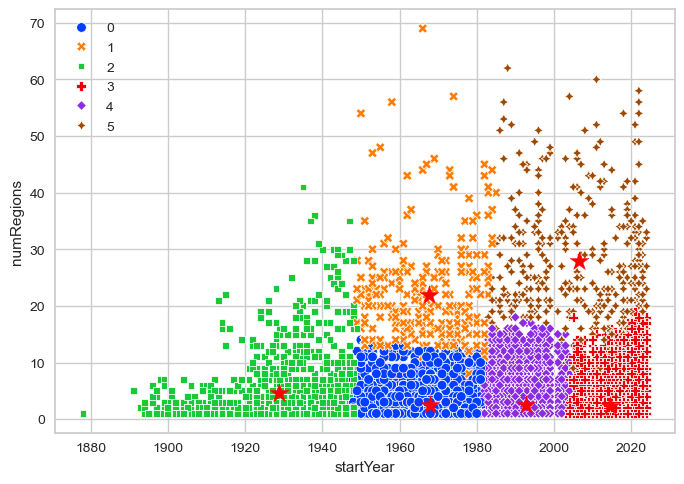

In [154]:
sns.scatterplot(data=df, 
                x="startYear",
                y="numRegions",
                hue=bkmeans.labels_, 
                style=bkmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,0], centers[:,8], c='red', marker='*', s=200)
plt.savefig('bisecting_k-means.png', dpi=300, bbox_inches='tight')
plt.show()

In [155]:
print('SSE', bkmeans.inertia_)
print('Silhouette', silhouette_score(X_minmax, bkmeans.labels_))

SSE 229.37616354825673
Silhouette 0.35634732426486665


In [111]:
!pip install yellowbrick

  Obtaining dependency information for yellowbrick from https://files.pythonhosted.org/packages/06/35/c7d44bb541c06bc41b3239b27af79ea0ecc7dbb156ee1335576f99c58b91/yellowbrick-1.5-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 282.6/282.6 kB 3.6 MB/s eta 0:00:0000:010:01


In [112]:
from yellowbrick.cluster import SilhouetteVisualizer

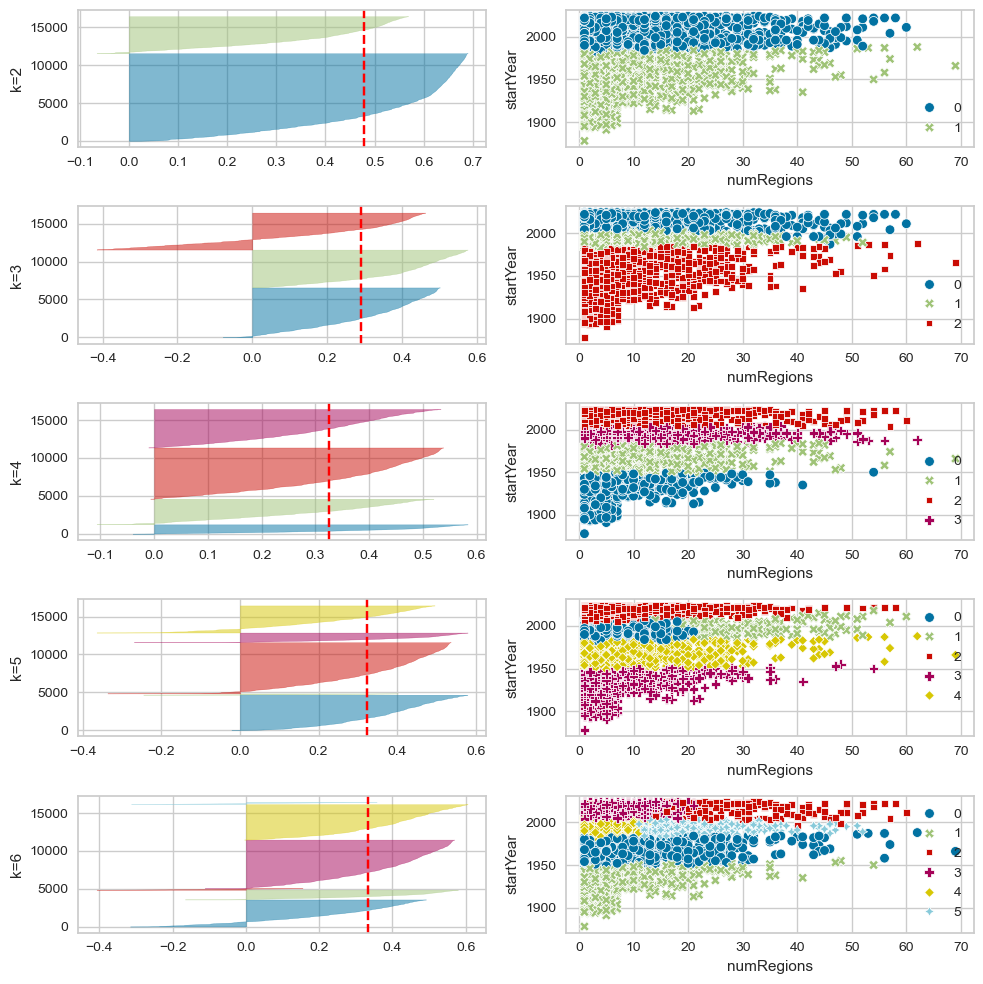

In [156]:
# Parametri
colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
n_clust = 7  # Numero di cluster da visualizzare

# Crea un grafico per ogni numero di cluster da 2 a n_clust
fig, axs = plt.subplots(n_clust-2, 2, figsize=(10,10))

for i in range(2, n_clust):
    bkmeans = BisectingKMeans(n_clusters=i)
    
    # Visualizza il Silhouette Visualizer in una cella della griglia
    visualizer = SilhouetteVisualizer(bkmeans, colors=colors, ax=axs[i-2][0])
    axs[i-2][0].set_ylabel("k=" + str(i))
    visualizer.fit(X_minmax)
    
    # Visualizza il grafico a dispersione nell'altra cella della griglia
    sns.scatterplot(data=df, x="numRegions", y="startYear", hue=bkmeans.labels_, 
                    palette=sns.color_palette(colors[:i]), style=bkmeans.labels_, ax=axs[i-2][1])

plt.savefig('bisectingk-means_plot.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

<h2>X-MEANS</h2>

In [39]:
pip install https://github.com/KulikDM/pyclustering/archive/Warning-Fix.zip

  Using cached https://github.com/KulikDM/pyclustering/archive/Warning-Fix.zip
  Preparing metadata (setup.py) ... done
Note: you may need to restart the kernel to use updated packages.


In [98]:
from pyclustering.cluster import xmeans

In [105]:
xm = xmeans.xmeans(X_minmax)
xm.process()

In [106]:
clusters = xm.get_clusters()

In [107]:
def clusters_to_labels(clusters):
    labels = np.empty(shape=(len(np.concatenate(clusters))), dtype=int)
    for i in range(len(clusters)):
        for idx in clusters[i]:
            labels[idx] = i
    return labels

In [108]:
labels = clusters_to_labels(clusters)

In [109]:
centers = np.array(xm.get_centers())
centers_unscaled = scaler.inverse_transform(centers)

<function matplotlib.pyplot.show(close=None, block=None)>

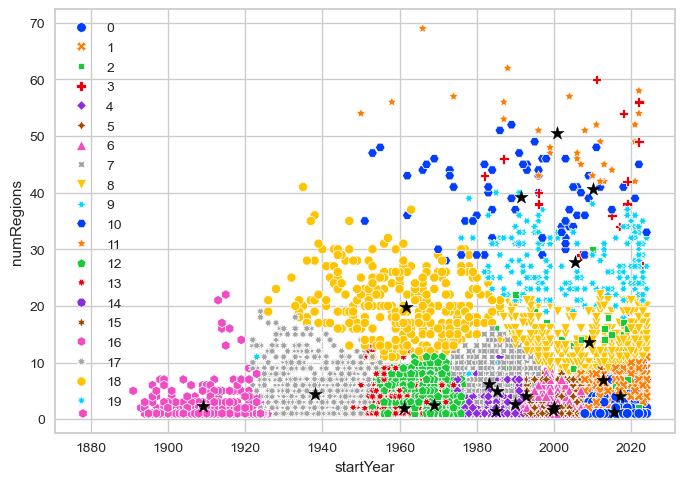

In [159]:
sns.scatterplot(data=df, x="startYear", y="numRegions", hue=labels, palette="bright", style=labels)
plt.scatter(centers_unscaled[:, 0], centers_unscaled[:,8], color="black", marker="*", s=100)
plt.savefig('x_means.png', dpi=300, bbox_inches='tight')
plt.show

<h2>K-MODE</h2>

In [42]:
df1 = data.copy()

In [43]:
df1.head()

,rating,startYear,runtimeMinutes,awardWins,totalImages,totalVideos,totalCredits,criticReviewsTotal,titleType,awardNominationsExcludeWins,canHaveEpisodes,isAdult,numRegions,userReviewsTotal,ratingCount,countryOfOrigin,genres
0,8,1995,58,0,1,0,21,1,1,0,0,0,1,0,781,['US'],"Action,Adventure,Animation"
1,6,1982,58,0,1,0,1,0,2,0,0,0,1,0,11,['XWG'],Action
2,6,1992,58,0,1,0,24,0,3,0,0,0,1,1,38,['RU'],Comedy
3,6,2021,58,0,22,0,56,0,4,0,1,0,1,0,15,['MX'],Reality-TV
4,8,2020,80,1,347,2,47,4,4,1,1,0,32,452,15746,['KR'],"Comedy,Drama,Romance"


In [44]:
# Lista dei valori unici in 'titleType'
unique_title_types = ['tvEpisode', 'videoGame', 'movie', 'tvSeries', 'video', 'tvMiniSeries', 'short', 'tvMovie', 'tvSpecial', 'tvShort']

# Crea un dizionario di mappatura che assegna un numero a ciascun tipo
title_type_mapping = {title: i + 1 for i, title in enumerate(unique_title_types)}

# Crea una mappatura inversa che assegna il numero alla stringa
reverse_title_type_mapping = {v: k for k, v in title_type_mapping.items()}

# Ora riconverti i numeri nel DataFrame df1 in stringhe
df1['titleType'] = df1['titleType'].map(reverse_title_type_mapping)

# Verifica il risultato
print(df1['titleType'].head())


0    tvEpisode
1    videoGame
2        movie
3     tvSeries
4     tvSeries
Name: titleType, dtype: object


In [45]:
# Esplodi 'countryOfOrigin' nel DataFrame df1
df1['countryOfOrigin'] = df1['countryOfOrigin'].explode()

# Esplodi 'genres' nel DataFrame df1
df1['genres'] = df1['genres'].explode()

# Verifica i risultati
df1.head()


,rating,startYear,runtimeMinutes,awardWins,totalImages,totalVideos,totalCredits,criticReviewsTotal,titleType,awardNominationsExcludeWins,canHaveEpisodes,isAdult,numRegions,userReviewsTotal,ratingCount,countryOfOrigin,genres
0,8,1995,58,0,1,0,21,1,tvEpisode,0,0,0,1,0,781,['US'],"Action,Adventure,Animation"
1,6,1982,58,0,1,0,1,0,videoGame,0,0,0,1,0,11,['XWG'],Action
2,6,1992,58,0,1,0,24,0,movie,0,0,0,1,1,38,['RU'],Comedy
3,6,2021,58,0,22,0,56,0,tvSeries,0,1,0,1,0,15,['MX'],Reality-TV
4,8,2020,80,1,347,2,47,4,tvSeries,1,1,0,32,452,15746,['KR'],"Comedy,Drama,Romance"


In [46]:
import pandas as pd
from kmodes.kmodes import KModes

# Sostituiamo le colonne 'countryOfOrigin' e 'genres' da liste di stringhe a stringhe
df1['countryOfOrigin'] = df1['countryOfOrigin'].apply(lambda x: ', '.join(x) if isinstance(x, list) else x)
df1['genres'] = df1['genres'].apply(lambda x: ', '.join(x) if isinstance(x, list) else x)

# Selezioniamo solo le colonne categoriche
data_categorical = df1[['titleType', 'countryOfOrigin', 'genres']]

# Crea un'istanza di KModes, scegliendo un numero di cluster (ad esempio, 3)
kmodes = KModes(n_clusters=3, init='Huang', n_init=10, verbose=1)

# Fit del modello ai dati
clusters = kmodes.fit_predict(data_categorical)

# Aggiungiamo i cluster al DataFrame
df1['cluster'] = clusters

# Mostriamo i risultati
print(df1[['titleType', 'countryOfOrigin', 'genres', 'cluster']].head())

# Centri dei cluster
print("Centri dei cluster:")
print(kmodes.cluster_centroids_)


Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 2229, cost: 28582.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 937, cost: 29886.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 1699, cost: 28779.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 3111, cost: 29842.0
Run 4, iteration: 2/100, moves: 2956, cost: 29842.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 1334, cost: 29136.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 6, iteration: 1/100, moves: 3383, cost: 30169.0
Run 6, iteration: 2/100, moves: 853, cost: 29909.0
Run 6, iteration: 3/100, moves: 122, cost: 29909.0
Init: initializing centroids
Init: initializing cluster

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 24912.0
Centri dei cluster:
   titleType countryOfOrigin       genres
0      movie          ['US']        Drama
1  tvEpisode          ['US']       Comedy
2      short          ['US']        Short
3   tvSeries          ['US']  Documentary
4      movie          ['GB']       Comedy


/var/folders/cq/nf_k2ymx2j15b3kqy1qp9zbw0000gn/T/ipykernel_59095/3795625158.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2')


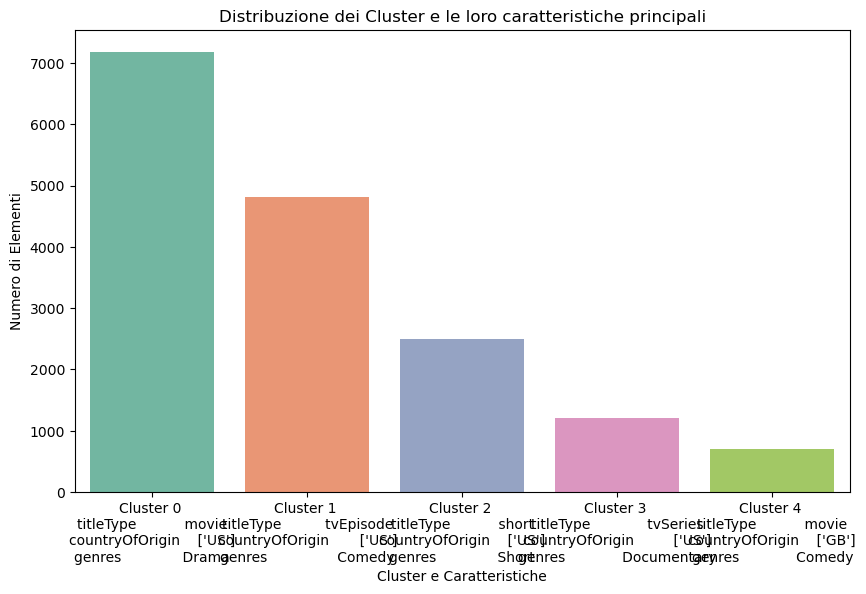

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
from kmodes.kmodes import KModes
import seaborn as sns

# Supponiamo che tu abbia un DataFrame `df1` con colonne categoriali da usare per il clustering

# Eseguiamo il clustering K-Modes
kmodes = KModes(n_clusters=5, init='Cao', n_init=3, verbose=1)
clusters = kmodes.fit_predict(df1[['titleType', 'countryOfOrigin', 'genres']])

# Aggiungi i cluster al DataFrame
df1['cluster'] = clusters

# Estraiamo i centri dei cluster (modalità per ciascun cluster)
cluster_centers = kmodes.cluster_centroids_

# Creiamo un DataFrame per visualizzare i centri dei cluster
centers_df = pd.DataFrame(cluster_centers, columns=['titleType', 'countryOfOrigin', 'genres'])

# Visualizzare i centri dei cluster
print("Centri dei cluster:")
print(centers_df)

# Conta il numero di occorrenze di ciascun cluster (per visualizzare quante righe ci sono per ogni cluster)
cluster_counts = df1['cluster'].value_counts()

# Plottiamo la distribuzione dei cluster con il nome del cluster sulle x
plt.figure(figsize=(10, 6))
sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2')

# Aggiungiamo il nome del cluster sulle x
plt.xticks(ticks=cluster_counts.index, labels=[f"Cluster {i} \n{centers_df.iloc[i].to_string()}" for i in cluster_counts.index])

plt.title('Distribuzione dei Cluster e le loro caratteristiche principali')
plt.xlabel('Cluster e Caratteristiche')
plt.ylabel('Numero di Elementi')
plt.show()


Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 11162.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...


/var/folders/cq/nf_k2ymx2j15b3kqy1qp9zbw0000gn/T/ipykernel_59095/3521726670.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', ax=axes[i])


Run 1, iteration: 1/100, moves: 0, cost: 18640.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...


/var/folders/cq/nf_k2ymx2j15b3kqy1qp9zbw0000gn/T/ipykernel_59095/3521726670.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', ax=axes[i])


Run 1, iteration: 1/100, moves: 0, cost: 21275.0


/var/folders/cq/nf_k2ymx2j15b3kqy1qp9zbw0000gn/T/ipykernel_59095/3521726670.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', ax=axes[i])


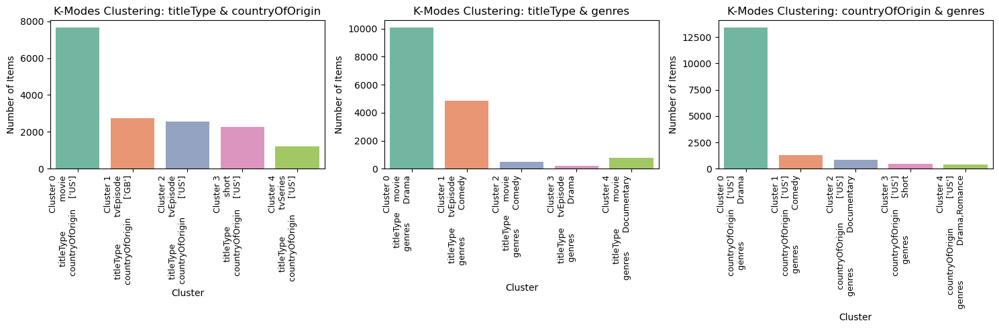

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
from kmodes.kmodes import KModes
import seaborn as sns
from itertools import combinations

# Assuming you have a DataFrame `df1` with categorical columns to use for clustering

# Variables to combine
variables = ['titleType', 'countryOfOrigin', 'genres']

# Create all combinations of two variables to analyze
combinations_of_two = list(combinations(variables, 2))

# Number of combinations
num_combinations = len(combinations_of_two)

# Calculate the number of rows and columns for the subplot layout
ncols = 3  # Set a fixed number of columns
nrows = (num_combinations + ncols - 1) // ncols  # Calculate the number of rows needed

# Set up the plot layout for the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))

# Flatten the axes to make them easier to work with
axes = axes.flatten()

# Run K-Modes and plot for each combination of variables
for i, (var1, var2) in enumerate(combinations_of_two):
    # Perform K-Modes clustering for the combination of variables
    kmodes = KModes(n_clusters=5, init='Cao', n_init=5, verbose=1)
    clusters = kmodes.fit_predict(df1[[var1, var2]])

    # Add the clusters to the DataFrame
    df1['cluster'] = clusters

    # Count the occurrences of each cluster
    cluster_counts = df1['cluster'].value_counts()

    # Plot the distribution of clusters for this combination of variables
    sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', ax=axes[i])

    # Get the cluster centers for the combination
    cluster_centers = kmodes.cluster_centroids_
    centers_df = pd.DataFrame(cluster_centers, columns=[var1, var2])

    # Add the cluster names on the x-axis
    axes[i].set_xticks(cluster_counts.index)
    axes[i].set_xticklabels([f"Cluster {i}\n{centers_df.iloc[i].to_string()}" for i in cluster_counts.index], fontsize=9)
    
    # Rotate the x-axis labels to avoid overlap
    for label in axes[i].get_xticklabels():
        label.set_rotation(90)  # Rotate labels by 30 degrees
        label.set_horizontalalignment('right')  # Align them to the right for better visibility

    # Set the title for the subplot
    axes[i].set_title(f'K-Modes Clustering: {var1} & {var2}', fontsize=12)
    axes[i].set_xlabel('Cluster', fontsize=10)
    axes[i].set_ylabel('Number of Items', fontsize=10)

# Remove any empty axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Add space between the subplots
plt.tight_layout()

# Show the plot
plt.savefig('k-mode.png', dpi=300, bbox_inches='tight')
plt.show()


<h1> DBSCAN </h1>

In [11]:
dbscan = DBSCAN(eps=0.02, min_samples=50)
dbscan.fit(X_minmax)

DBSCAN(eps=0.02, min_samples=50)

Numero di cluster: 4
Numero di punti rumorosi: 7443


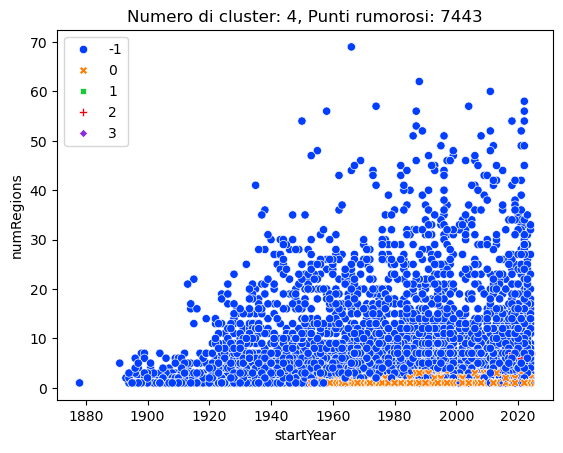

In [12]:
# Calcola il numero di cluster (escludendo il rumore)
num_clusters = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)

# Calcola il numero di punti rumorosi
num_noise = list(dbscan.labels_).count(-1)

# Stampa il numero di cluster e di punti rumorosi
print(f"Numero di cluster: {num_clusters}")
print(f"Numero di punti rumorosi: {num_noise}")

# Crea il grafico scatter
sns.scatterplot(data=df, 
                x="startYear",
                y="numRegions",
                hue=dbscan.labels_, 
                style=dbscan.labels_, 
                palette="bright")

# Aggiungi titolo con il numero di cluster e di punti rumorosi
plt.title(f"Numero di cluster: {num_clusters}, Punti rumorosi: {num_noise}")
plt.show()


In [13]:
print('Silhouette', silhouette_score(X_minmax, dbscan.labels_))
#SSE non si può calcolare per dbscan, non esiste inertia


Silhouette -0.3231947124139235


Nel caso di DBSCAN, non è necessario escludere manualmente i punti rumorosi (-1) quando calcoli il Silhouette Score. Questo perché DBSCAN, a differenza di OPTICS, non genera una classe specifica per i punti rumorosi, ma assegna l'etichetta -1 ai punti che considera rumore.

<h3>kth neighbor distance</h3>

In [14]:
dist = pdist(X_minmax, 'euclidean')
dist = squareform(dist)

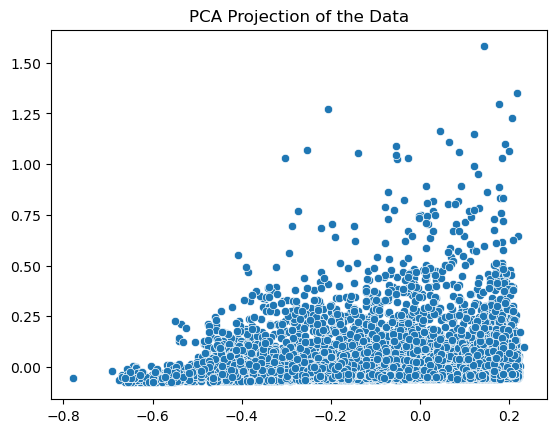

In [15]:
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

# Ridurre la dimensionalità a 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_minmax)

# Creare uno scatter plot
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1])
plt.title('PCA Projection of the Data')
plt.show()


<h3> Altre prove: </h3>

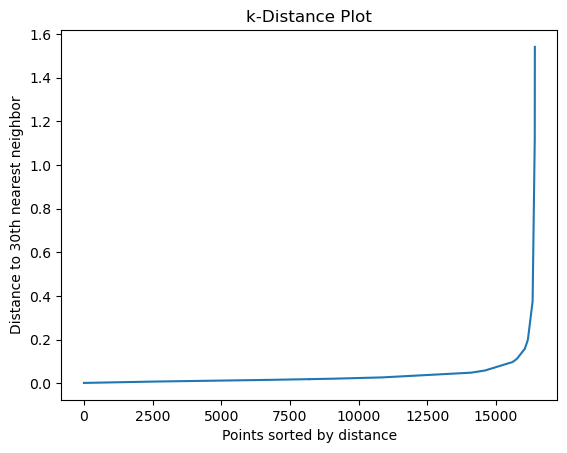

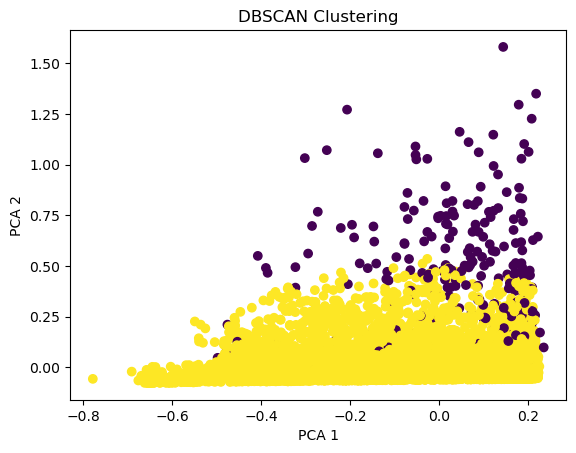

Numero di cluster: 1
Punti rumorosi (etichettati come -1): 259


In [16]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

# Dati di input (X_minmax è già normalizzato)
X = X_minmax

# Proviamo a calcolare il parametro `eps` automaticamente con k-distance plot
neighbors = NearestNeighbors(n_neighbors=30)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)

# Ordinare le distanze per trovare la curva "a gomito" nel k-distance plot
distances = np.sort(distances[:, -1], axis=0)

# Plot delle distanze
plt.plot(distances)
plt.title('k-Distance Plot')
plt.xlabel('Points sorted by distance')
plt.ylabel('Distance to 30th nearest neighbor')
plt.show()

# Dal grafico, scegli un valore di eps che corrisponde al punto dove la curva inizia a livellarsi

# Supponiamo di scegliere un valore di `eps` basato sul grafico
eps = 0.15  # Esempio di valore trovato dal grafico
min_samples = 50  # Puoi provarlo anche più basso per cluster più piccoli

# Fitting con DBSCAN con nuovi parametri
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan.fit(X)

# Visualizza i cluster (usa PCA per ridurre a 2D per visualizzare)
from sklearn.decomposition import PCA

# Ridurre a 2D per visualizzazione
pca = PCA(n_components=2)
X_2D = pca.fit_transform(X)

# Plot dei cluster
plt.scatter(X_2D[:, 0], X_2D[:, 1], c=dbscan.labels_, cmap='viridis')
plt.title('DBSCAN Clustering')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

# Controlla il numero di cluster e dei punti rumorosi (etichettati come -1)
print("Numero di cluster:", len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0))
print("Punti rumorosi (etichettati come -1):", list(dbscan.labels_).count(-1))


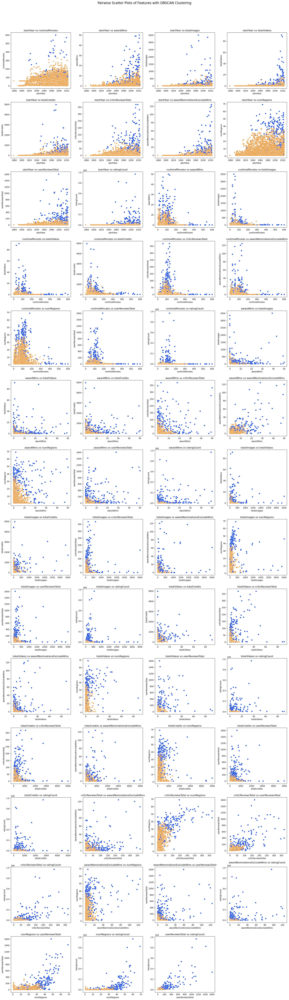

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

def plot_pairwise_clusters_dbscan(df, dbscan, columns, ncols=4, palette="bright"):
    """
    Funzione per creare scatter plot per ogni coppia di variabili del DataFrame e disporli in subplots.
    
    Parameters:
    - df: DataFrame con i dati
    - dbscan: modello DBSCAN con etichette dei cluster
    - columns: lista delle colonne del DataFrame da usare per il grafico
    - ncols: numero di colonne nel layout di subplots
    - palette: palette dei colori per i grafici (default è "bright")
    """
    # Ottieni tutte le combinazioni di colonne
    column_combinations = list(itertools.combinations(columns, 2))

    # Calcola il numero di righe necessarie per i subplots
    nrows = (len(column_combinations) + ncols - 1) // ncols

    # Imposta il layout dei subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5 * nrows))
    axes = axes.flatten()  # Appiattisci l'array di axes per facilitare l'accesso

    # Crea i grafici
    for i, (x_col, y_col) in enumerate(column_combinations):
        sns.scatterplot(data=df, 
                        x=x_col, 
                        y=y_col, 
                        hue=dbscan.labels_, 
                        style=dbscan.labels_,
                        palette=palette, 
                        ax=axes[i])  # Passa l'asse specifico per il grafico
        axes[i].set_title(f'{x_col} vs {y_col}')
        axes[i].set_xlabel(x_col)
        axes[i].set_ylabel(y_col)
        axes[i].legend().set_visible(False)  # Disabilita la legenda per evitare sovrapposizioni

    # Rimuovi eventuali subplot vuoti
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Aggiungi un titolo generale al grafico
    plt.suptitle('Pairwise Scatter Plots of Features with DBSCAN Clustering', fontsize=16)

    # Regola il layout per evitare sovrapposizioni
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Aggiungi un margine per il titolo

    plt.show()

# Usa la funzione per creare i grafici con il tuo dataset e DBSCAN
plot_pairwise_clusters_dbscan(df, dbscan, df.columns, ncols=4)


<h2> OPTICS </h2>

In [26]:
from sklearn.cluster import OPTICS, cluster_optics_dbscan

In [27]:
optics = OPTICS(min_samples = 4, max_eps = np.inf, min_cluster_size=40)
optics.fit(X_minmax)

/Users/apple/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_optics.py:1083: RuntimeWarning: divide by zero encountered in divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


OPTICS(min_cluster_size=40, min_samples=4)

In [28]:
print('Silhouette', silhouette_score(X_minmax, optics.labels_))
print("Silhouette", silhouette_score(X_minmax[optics.labels_ != -1], optics.labels_[optics.labels_ != -1]))

Silhouette -0.5459326756696155
Silhouette 0.4076872824381957


DBSCAN: Puoi calcolare direttamente il Silhouette Score senza preoccuparti di escludere i punti rumorosi. La funzione silhouette_score di sklearn li ignorerà automaticamente.
OPTICS: Quando calcoli il Silhouette Score per OPTICS, di solito escludi i punti rumorosi (-1) manualmente, come nel tuo esempio, per evitare che vengano inclusi nel calcolo del punteggio.


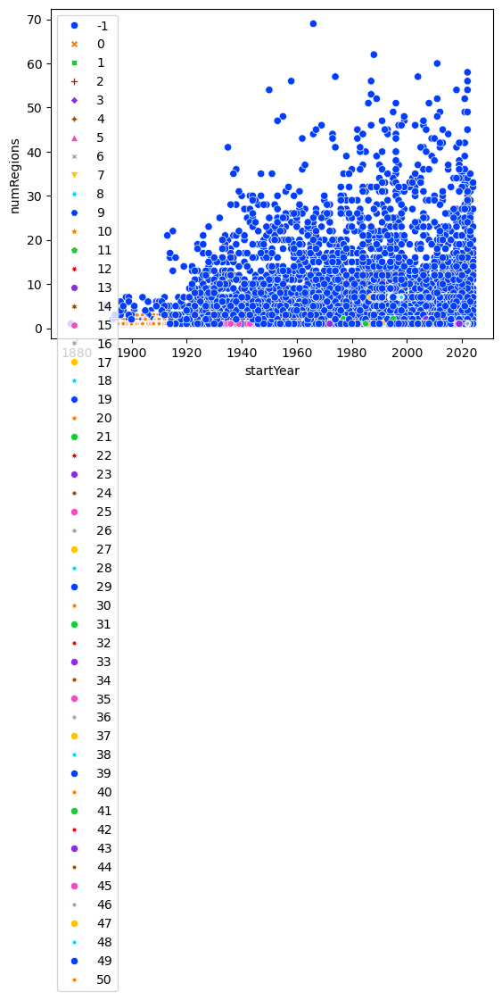

In [29]:
sns.scatterplot(data=df, 
                x="startYear",
                y="numRegions",
                hue=optics.labels_, 
                style=optics.labels_, 
                palette="bright")
plt.show()

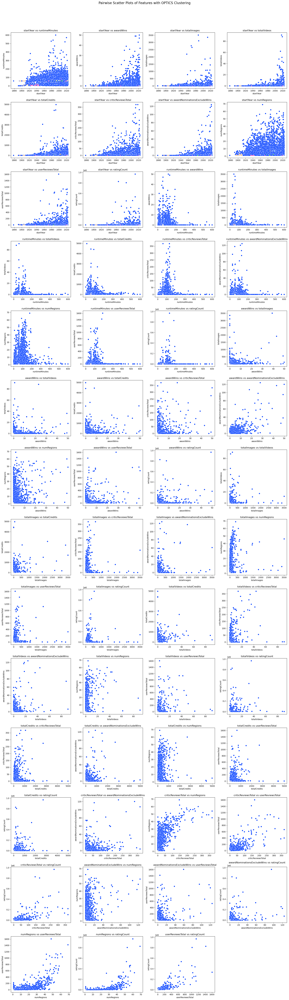

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

def plot_pairwise_clusters_optics(df, optics, columns, ncols=4, palette="bright"):
    """
    Funzione per creare scatter plot per ogni coppia di variabili del DataFrame e disporli in subplots,
    utilizzando il modello OPTICS per il clustering.
    
    Parameters:
    - df: DataFrame con i dati
    - optics: modello OPTICS con etichette dei cluster
    - columns: lista delle colonne del DataFrame da usare per il grafico
    - ncols: numero di colonne nel layout di subplots
    - palette: palette dei colori per i grafici (default è "bright")
    """
    # Ottieni tutte le combinazioni di colonne
    column_combinations = list(itertools.combinations(columns, 2))

    # Calcola il numero di righe necessarie per i subplots
    nrows = (len(column_combinations) + ncols - 1) // ncols

    # Imposta il layout dei subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5 * nrows))
    axes = axes.flatten()  # Appiattisci l'array di axes per facilitare l'accesso

    # Crea i grafici
    for i, (x_col, y_col) in enumerate(column_combinations):
        sns.scatterplot(data=df, 
                        x=x_col, 
                        y=y_col, 
                        hue=optics.labels_,  # Usa le etichette dei cluster di OPTICS
                        style=optics.labels_,
                        palette=palette, 
                        ax=axes[i])  # Passa l'asse specifico per il grafico
        axes[i].set_title(f'{x_col} vs {y_col}')
        axes[i].set_xlabel(x_col)
        axes[i].set_ylabel(y_col)
        axes[i].legend().set_visible(False)  # Disabilita la legenda per evitare sovrapposizioni

    # Rimuovi eventuali subplot vuoti
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Aggiungi un titolo generale al grafico
    plt.suptitle('Pairwise Scatter Plots of Features with OPTICS Clustering', fontsize=16)

    # Regola il layout per evitare sovrapposizioni
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Aggiungi un margine per il titolo

    plt.show()

# Usa la funzione per creare i grafici con il tuo dataset e OPTICS
plot_pairwise_clusters_optics(df, optics, df.columns, ncols=4)


Text(0.5, 1.0, 'Reachability Plot')

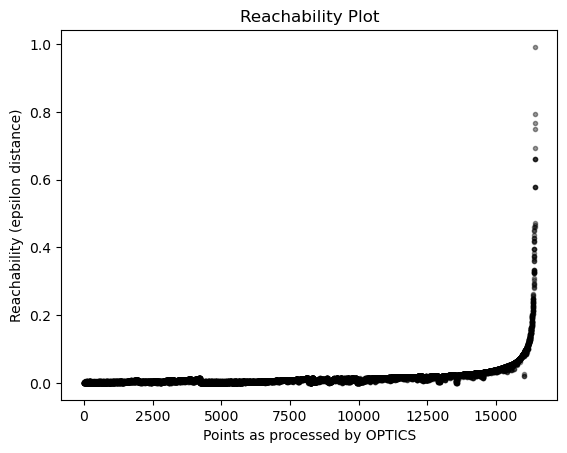

In [31]:
# Valleys in the plot correspond to the clusters
space = np.arange(len(X_minmax))
reachability = optics.reachability_[optics.ordering_]
labels = optics.labels_[optics.ordering_]

# Reachability plot
plt.plot(space, reachability, "k.", alpha=0.4)
plt.xlabel("Points as processed by OPTICS")
plt.ylabel("Reachability (epsilon distance)")
# plt.axhline(0.3, c="red")
plt.title("Reachability Plot")
#each peak is bc we are crossing from 1 cl to the other! for definition

<h2> HDBSCAN</h2>

In [32]:
from sklearn.cluster import HDBSCAN

In [33]:
hdb = HDBSCAN(cluster_selection_epsilon=0.5, min_samples=50, 
              min_cluster_size=15, max_cluster_size=None,
              store_centers="centroid")
hdb.fit(X_minmax)

HDBSCAN(cluster_selection_epsilon=0.5, min_cluster_size=15, min_samples=50,
        store_centers='centroid')

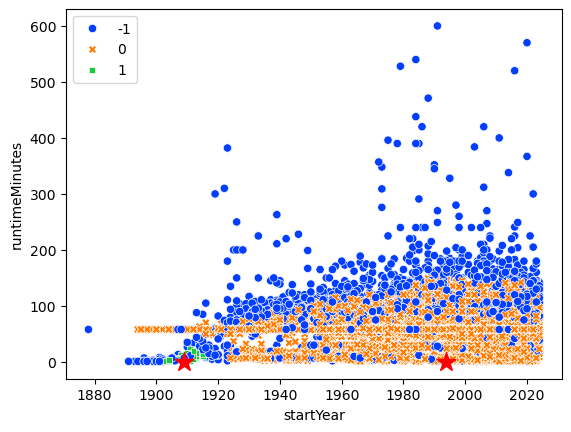

In [34]:
sns.scatterplot(data=df, 
                x="startYear",
                y="runtimeMinutes",
                hue=hdb.labels_, 
                style=hdb.labels_, 
                palette="bright")
plt.scatter(scaler.inverse_transform(hdb.centroids_)[:,0], scaler.inverse_transform(hdb.centroids_)[:,2], c='red', marker='*', s=200)
plt.show()

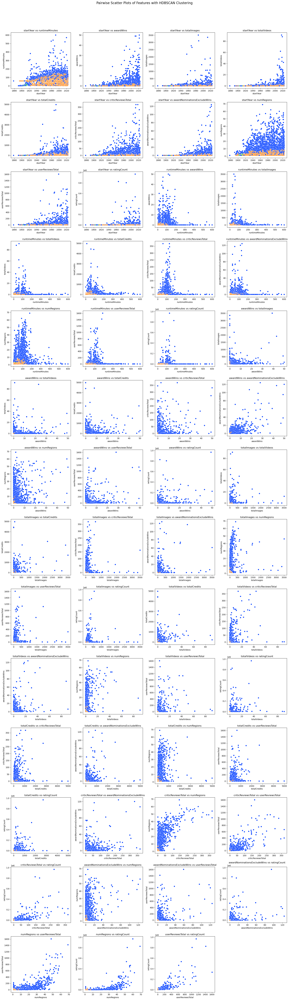

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

def plot_pairwise_clusters_hdbscan(df, hdb, columns, ncols=4, palette="bright"):
    """
    Funzione per creare scatter plot per ogni coppia di variabili del DataFrame e disporli in subplots,
    utilizzando il modello HDBSCAN per il clustering.
    
    Parameters:
    - df: DataFrame con i dati
    - hdb: modello HDBSCAN con etichette dei cluster
    - columns: lista delle colonne del DataFrame da usare per il grafico
    - ncols: numero di colonne nel layout di subplots
    - palette: palette dei colori per i grafici (default è "bright")
    """
    # Ottieni tutte le combinazioni di colonne
    column_combinations = list(itertools.combinations(columns, 2))

    # Calcola il numero di righe necessarie per i subplots
    nrows = (len(column_combinations) + ncols - 1) // ncols

    # Imposta il layout dei subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5 * nrows))
    axes = axes.flatten()  # Appiattisci l'array di axes per facilitare l'accesso

    # Crea i grafici
    for i, (x_col, y_col) in enumerate(column_combinations):
        sns.scatterplot(data=df, 
                        x=x_col, 
                        y=y_col, 
                        hue=hdb.labels_,  # Usa le etichette dei cluster di HDBSCAN
                        style=hdb.labels_,
                        palette=palette, 
                        ax=axes[i])  # Passa l'asse specifico per il grafico
        axes[i].set_title(f'{x_col} vs {y_col}')
        axes[i].set_xlabel(x_col)
        axes[i].set_ylabel(y_col)
        axes[i].legend().set_visible(False)  # Disabilita la legenda per evitare sovrapposizioni

    # Rimuovi eventuali subplot vuoti
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Aggiungi un titolo generale al grafico
    plt.suptitle('Pairwise Scatter Plots of Features with HDBSCAN Clustering', fontsize=16)

    # Regola il layout per evitare sovrapposizioni
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Aggiungi un margine per il titolo

    plt.show()

# Usa la funzione per creare i grafici con il tuo dataset e HDBSCAN
plot_pairwise_clusters_hdbscan(df, hdb, df.columns, ncols=4)


In [36]:
np.unique(hdb.labels_, return_counts=True)

(array([-1,  0,  1]), array([ 3340, 13008,    68]))

In [37]:
hdb.centroids_

array([[7.92146337e-01, 9.02466610e-02, 1.12469278e-03, 1.19344836e-03,
        6.02196431e-04, 8.79715475e-03, 1.33798263e-03, 7.03910853e-04,
        1.15713027e-02, 7.04263987e-04, 1.39000179e-04],
       [2.12096396e-01, 1.35105680e-02, 0.00000000e+00, 3.20521379e-04,
        0.00000000e+00, 1.16788119e-03, 4.99415697e-04, 0.00000000e+00,
        8.18719158e-03, 1.22575227e-03, 6.41771322e-05]])

In [38]:
print("Silhouette", silhouette_score(X_minmax[hdb.labels_ != -1], hdb.labels_[hdb.labels_ != -1]))

Silhouette 0.6093211173081804


<h1>HIERARCHICAL</h1>

In [24]:
def get_linkage_matrix(model):
    # Create linkage matrix 
    
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    return linkage_matrix

def plot_dendrogram(model, **kwargs):
    linkage_matrix = get_linkage_matrix(model)
    dendrogram(linkage_matrix, **kwargs)

In [37]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric='manhattan', linkage='average')
model = model.fit(X_minmax)

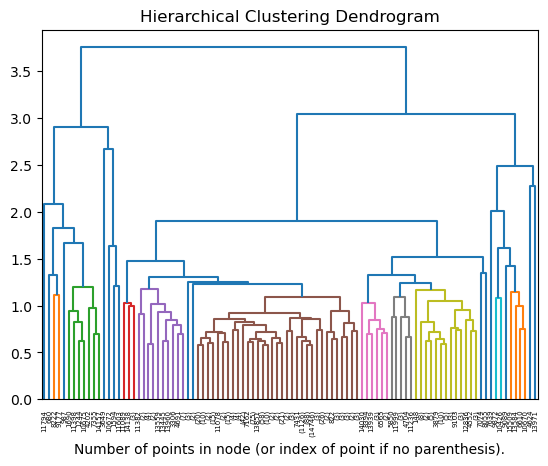

In [38]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp",p=100, color_threshold=1.2)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [27]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=1.2, criterion='distance')

In [64]:
labels

array([48, 51, 48, ..., 18, 40, 16], dtype=int32)

In [65]:
print('Silhouette', silhouette_score(X_minmax, labels))

Silhouette 0.23226092486401306


In [66]:
hier = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='complete')
hier.fit(X_minmax)

AgglomerativeClustering(linkage='complete', n_clusters=3)

In [67]:
hier.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [68]:
hier = AgglomerativeClustering(n_clusters=6, metric='precomputed', linkage='complete')
hier.fit(dist)

AgglomerativeClustering(linkage='complete', metric='precomputed', n_clusters=6)

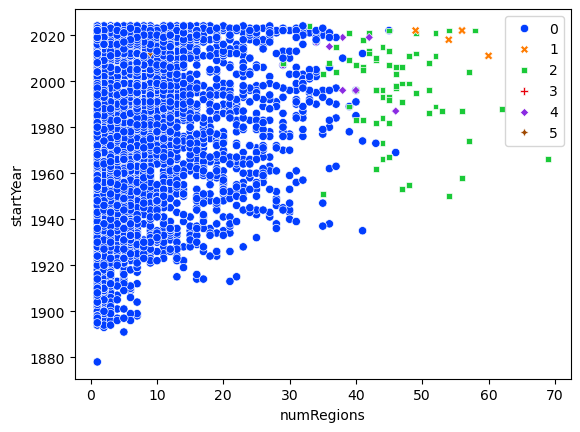

In [69]:
sns.scatterplot(data=df, 
                x="numRegions",
                y="startYear", 
                hue=hier.labels_, 
                style=hier.labels_, 
                palette="bright")
plt.show()

<h2> VARIE PROVE DI HIERARCHICAL </h2>

In [73]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric='manhattan', linkage='average')
model = model.fit(X_minmax)a

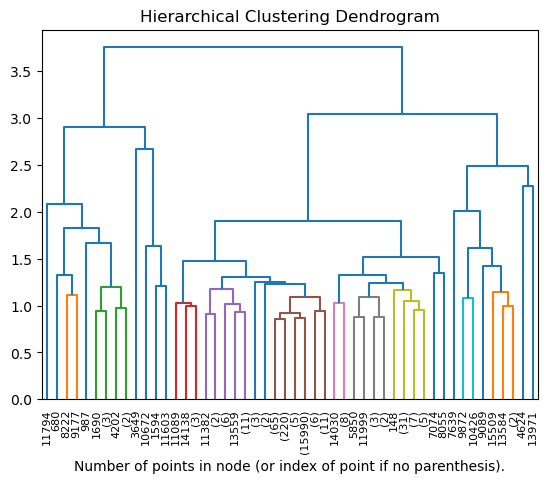

In [74]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp",p=50, color_threshold=1.2)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [75]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=1.2, criterion='distance')

In [76]:
labels

array([14, 14, 14, ..., 14, 14, 14], dtype=int32)

In [77]:
print('Silhouette', silhouette_score(X_minmax, labels))

Silhouette 0.6124293627138716


In [78]:
print(f'Cluster sizes: {np.bincount(value[0].labels_)}')

Cluster sizes: [16391    22     3]


In [79]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric='manhattan', linkage='single')
model = model.fit(X_minmax)

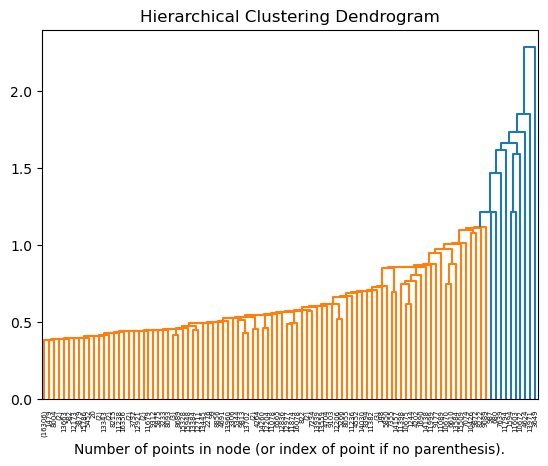

In [80]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp",p=100, color_threshold=1.2)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [81]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=1.2, criterion='distance')

In [82]:
labels
print('Silhouette', silhouette_score(X_minmax, labels))

Silhouette 0.8016009349854133


In [83]:
print(f'Cluster sizes: {np.bincount(value[0].labels_)}')

Cluster sizes: [16391    22     3]


In [84]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric='manhattan', linkage='complete')
model = model.fit(X_minmax)

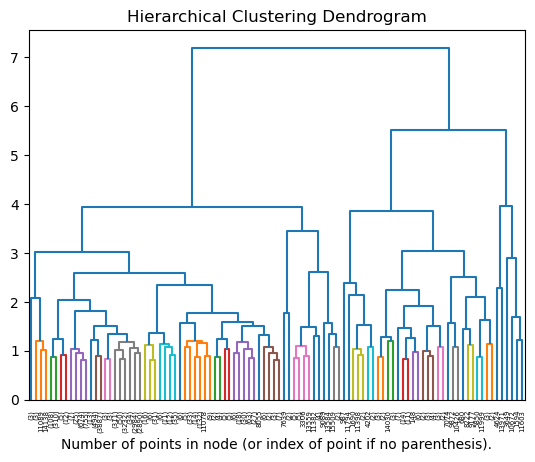

In [85]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp",p=100, color_threshold=1.2)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [86]:
# get the labels according to a specific threshold value cut
Z = get_linkage_matrix(model)
labels = fcluster(Z, t=1.2, criterion='distance')

In [87]:
labels
print('Silhouette', silhouette_score(X_minmax, labels))

Silhouette 0.2215831721967784


In [88]:
print(f'Cluster sizes: {np.bincount(value[0].labels_)}')

Cluster sizes: [16391    22     3]


<h1>HIERARCHICAL CON NUMERO DI CLUSTER</h1>

In [100]:
hier = AgglomerativeClustering(n_clusters=6, metric='euclidean', linkage='complete')
hier.fit(X_minmax)

AgglomerativeClustering(linkage='complete', n_clusters=6)

In [101]:
from sklearn.neighbors import kneighbors_graph

# hierarchical clustering
# Compute the (weighted) graph of k-Neighbors for points in X
connectivity = kneighbors_graph(X_minmax, n_neighbors=100, include_self=False)

In [102]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, 
                                n_clusters=None, 
                                metric='euclidean', 
                                linkage='ward', 
                                connectivity=connectivity)
                                
# connecet: Defines for each sample the neighboring 
# samples following a given structure of the data.

model = model.fit(X_minmax)

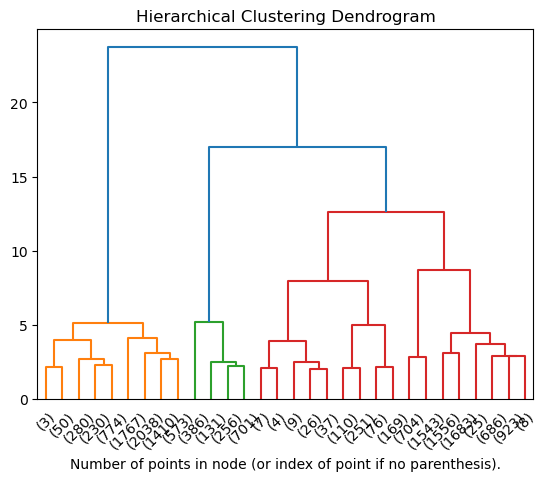

In [110]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [107]:
ward = AgglomerativeClustering(n_clusters=6, 
                               linkage='ward', 
                               metric='euclidean',
                               connectivity=connectivity)
ward.fit(X_minmax)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_minmax, ward.labels_))

labels {0: 1474, 1: 7125, 2: 606, 3: 4881, 4: 2247, 5: 83}
silhouette 0.33598563704669526


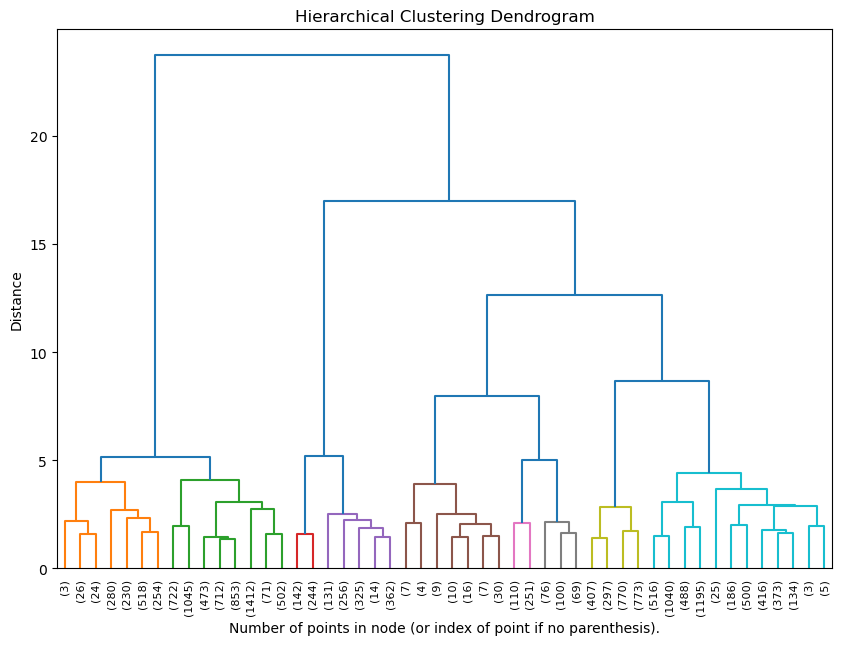

In [113]:
# Calcola la matrice di linkage con il metodo 'ward' e la metrica 'euclidean'
Z = linkage(X_minmax, method='ward', metric='euclidean')

# Traccia il dendrogramma utilizzando la matrice di linkage
plt.figure(figsize=(10, 7))
plt.title("Hierarchical Clustering Dendrogram")
dendrogram(Z, 
           truncate_mode="lastp",  # Mostra solo l'ultimo livello di unione
           p=50,  # Numero di punti da visualizzare
           color_threshold=5)  # Imposta la soglia di colore (in base alla distanza)

plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel("Distance")
plt.show()

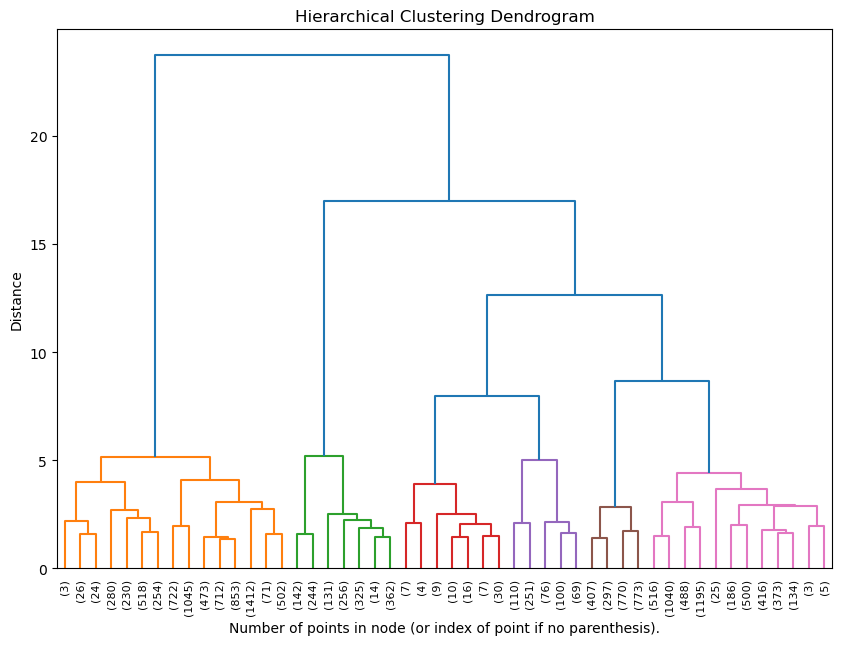

labels {0: 1474, 1: 7125, 2: 606, 3: 4881, 4: 2247, 5: 83}
silhouette 0.33598563704669526


In [118]:
# Impostazione di AgglomerativeClustering con Ward e la connettività
ward = AgglomerativeClustering(n_clusters=6, 
                               linkage='ward', 
                               metric='euclidean',
                               connectivity=None)  # Assumiamo che 'connectivity' non sia necessaria per il dendrogramma

# Esegui il clustering
ward.fit(X_minmax)

# Calcola la matrice di linkage con il metodo 'ward' e la metrica 'euclidean'
Z = linkage(X_minmax, method='ward', metric='euclidean')

# Traccia il dendrogramma utilizzando la matrice di linkage
plt.figure(figsize=(10, 7))
plt.title("Hierarchical Clustering Dendrogram")
dendrogram(Z, 
           truncate_mode="lastp",  # Mostra solo l'ultimo livello di unione
           p=50,  # Numero di punti da visualizzare
           color_threshold=7)  # Imposta la soglia di colore (in base alla distanza)

plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.ylabel("Distance")
plt.show()

# Calcolare l'Histogram delle etichette dei cluster
hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))

# Calcolare il silhouette score
print('silhouette', silhouette_score(X_minmax, ward.labels_))

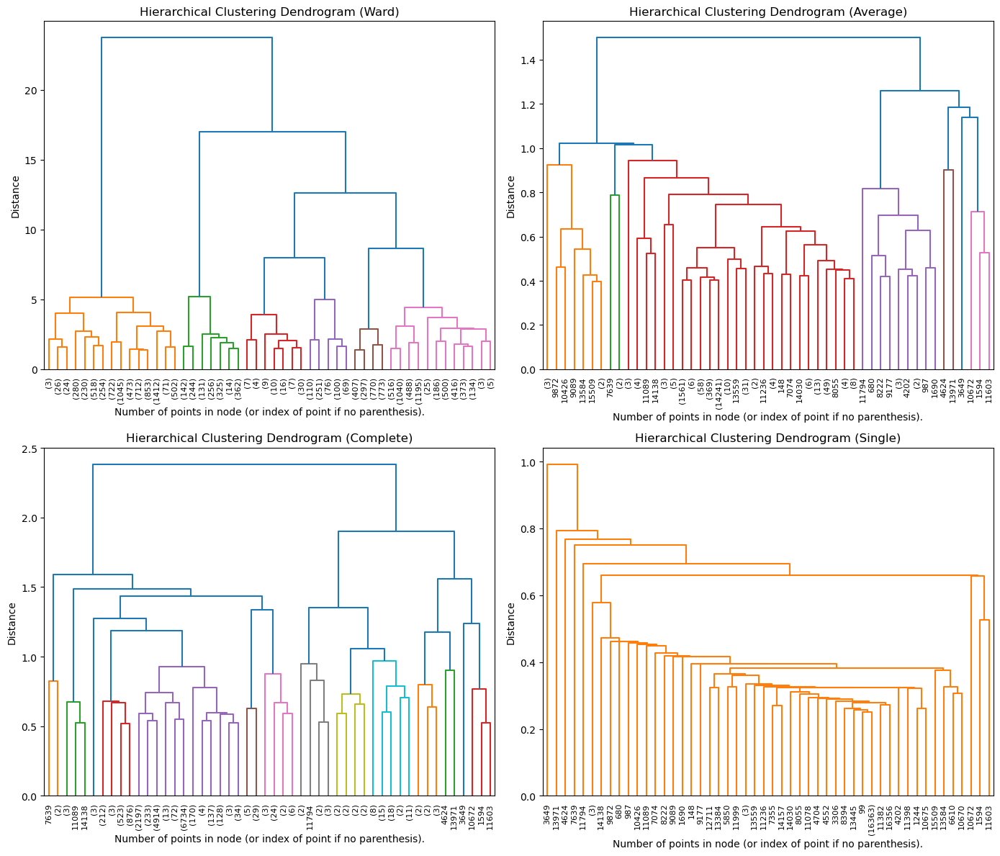

In [59]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import silhouette_score

# Metodo di clustering Agglomerative
def plot_dendrogram_and_silhouette(X_minmax, linkage_method, ax, color_threshold=1):
    # Esegui l'AgglomerativeClustering
    model = AgglomerativeClustering(n_clusters=6, linkage=linkage_method, metric='euclidean')
    model.fit(X_minmax)

    # Calcola la matrice di linkage con il metodo specificato
    Z = linkage(X_minmax, method=linkage_method, metric='euclidean')

    # Traccia il dendrogramma nel subplot specificato
    dendrogram(Z, 
               truncate_mode="lastp",  # Mostra solo l'ultimo livello di unione
               p=50,  # Numero di punti da visualizzare
               color_threshold=color_threshold,  # Imposta la soglia di colore
               ax=ax)  # Assegna il plot all'asse

    ax.set_title(f"Hierarchical Clustering Dendrogram ({linkage_method.capitalize()})")
    ax.set_xlabel("Number of points in node (or index of point if no parenthesis).")
    ax.set_ylabel("Distance")

# Crea una figura con 4 subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 12))

# Esegui per ciascun metodo di linkage con specifico color_threshold e disegna nei subplot

# Ward
plot_dendrogram_and_silhouette(X_minmax, linkage_method='ward', ax=axs[0, 0], color_threshold=7)

# Average
plot_dendrogram_and_silhouette(X_minmax, linkage_method='average', ax=axs[0, 1], color_threshold=1)

# Complete
plot_dendrogram_and_silhouette(X_minmax, linkage_method='complete', ax=axs[1, 0], color_threshold=1)

# Single
plot_dendrogram_and_silhouette(X_minmax, linkage_method='single', ax=axs[1, 1], color_threshold=1)

# Aggiungi uno spazio tra i subplots
plt.tight_layout()
plt.savefig('hierarchical_clustering_dendrograms_nclusters.png', dpi=300, bbox_inches='tight')
plt.show()


<h1>HIERARCHICAL with MANHATTAN</h1>

In [11]:
def get_linkage_matrix(model):
    # Create linkage matrix 
    
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    return linkage_matrix

def plot_dendrogram(model, **kwargs):
    linkage_matrix = get_linkage_matrix(model)
    dendrogram(linkage_matrix, **kwargs)
    
#funct to use to have the labels

<h2>AVERAGE - MANHATTAN</h2>

In [13]:
#AVERAGE
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
avg_model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='manhattan', linkage='average')
avg_model = avg_model.fit(X_minmax)
#run at the begininng without specifying any k

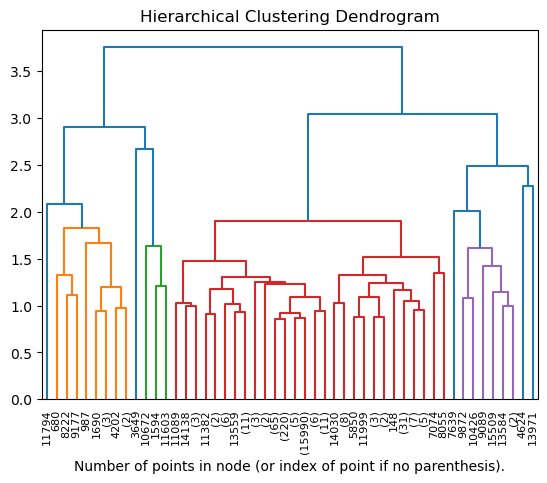

In [20]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(avg_model, truncate_mode= 'lastp', p= 50 ,color_threshold=2) #definingcol threshold
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()
#creating n cl, the rest are noises
#if no parentheses -> noise point creating a cl all alone
#questo è il dend completo, dove sono plottati tutti i dsti, 
#mentre per vedere solo una certs soglia dobbiamo cambiare il parametro truncate mode

In [21]:
# get the labels according to a specific threshold value cut
#we have to choose cls according to dendog. then cut then we have labels
Z = get_linkage_matrix(avg_model) #model is the initialized aggcl
labels = fcluster(Z, t=0.7, criterion='distance')
#t is thershold of the labels

In [22]:
print('Silhouette', silhouette_score(X_minmax, labels))

Silhouette 0.31231940784220025


In [23]:
# Conta i cluster e i punti per ciascun cluster
unique_labels, counts = np.unique(labels, return_counts=True)

# Visualizza i risultati
for label, count in zip(unique_labels, counts):
    print(f"Cluster {label}: {count} punti")

Cluster 1: 1 punti
Cluster 2: 1 punti
Cluster 3: 1 punti
Cluster 4: 2 punti
Cluster 5: 1 punti
Cluster 6: 1 punti
Cluster 7: 2 punti
Cluster 8: 1 punti
Cluster 9: 1 punti
Cluster 10: 1 punti
Cluster 11: 1 punti
Cluster 12: 1 punti
Cluster 13: 1 punti
Cluster 14: 1 punti
Cluster 15: 3 punti
Cluster 16: 1 punti
Cluster 17: 1 punti
Cluster 18: 2 punti
Cluster 19: 1 punti
Cluster 20: 6 punti
Cluster 21: 2 punti
Cluster 22: 8 punti
Cluster 23: 1 punti
Cluster 24: 1 punti
Cluster 25: 3 punti
Cluster 26: 2 punti
Cluster 27: 47 punti
Cluster 28: 17 punti
Cluster 29: 1 punti
Cluster 30: 4 punti
Cluster 31: 4 punti
Cluster 32: 42 punti
Cluster 33: 145 punti
Cluster 34: 25 punti
Cluster 35: 2 punti
Cluster 36: 3 punti
Cluster 37: 15961 punti
Cluster 38: 3 punti
Cluster 39: 26 punti
Cluster 40: 2 punti
Cluster 41: 4 punti
Cluster 42: 6 punti
Cluster 43: 2 punti
Cluster 44: 3 punti
Cluster 45: 2 punti
Cluster 46: 3 punti
Cluster 47: 2 punti
Cluster 48: 1 punti
Cluster 49: 1 punti
Cluster 50: 1 punt

<h2> SINGLE - MANHATTAN</h2>

In [25]:
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
sin_model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='manhattan', linkage='single')
sin_model = sin_model.fit(X_minmax)
#run at the begininng without specifying any k

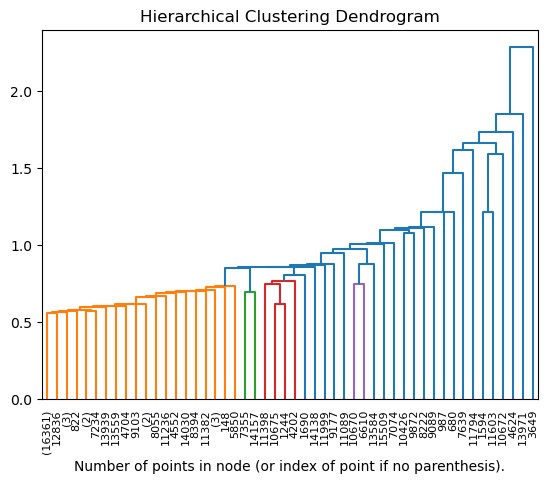

In [26]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(sin_model, truncate_mode= 'lastp', p= 50 ,color_threshold=0.8) #definingcol threshold
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()
#creating n cl, the rest are noises
#if no parentheses -> noise point creating a cl all alone
#questo è il dend completo, dove sono plottati tutti i dsti, 
#mentre per vedere solo una certs soglia dobbiamo cambiare il parametro truncate mode

In [27]:
# get the labels according to a specific threshold value cut
#we have to choose cls according to dendog. then cut then we have labels
Z = get_linkage_matrix(sin_model) #model is the initialized aggcl
labelss = fcluster(Z, t=0.7, criterion='distance')
#t is thershold of the labels

In [28]:
# Conta i cluster e i punti per ciascun cluster
unique_labels, counts = np.unique(labelss, return_counts=True)

# Visualizza i risultati
for label, count in zip(unique_labels, counts):
    print(f"Cluster {label}: {count} punti")

Cluster 1: 16380 punti
Cluster 2: 1 punti
Cluster 3: 3 punti
Cluster 4: 1 punti
Cluster 5: 1 punti
Cluster 6: 2 punti
Cluster 7: 2 punti
Cluster 8: 1 punti
Cluster 9: 1 punti
Cluster 10: 1 punti
Cluster 11: 1 punti
Cluster 12: 1 punti
Cluster 13: 1 punti
Cluster 14: 1 punti
Cluster 15: 1 punti
Cluster 16: 1 punti
Cluster 17: 1 punti
Cluster 18: 1 punti
Cluster 19: 1 punti
Cluster 20: 1 punti
Cluster 21: 1 punti
Cluster 22: 1 punti
Cluster 23: 1 punti
Cluster 24: 1 punti
Cluster 25: 1 punti
Cluster 26: 1 punti
Cluster 27: 1 punti
Cluster 28: 1 punti
Cluster 29: 1 punti
Cluster 30: 1 punti
Cluster 31: 1 punti
Cluster 32: 1 punti
Cluster 33: 1 punti


In [30]:
print('Silhouette', silhouette_score(X_minmax, labelss))

Silhouette 0.7024609558204645


<h2> COMPLETE - MANHATTAN</h2>

In [31]:
# setting distance_threshold=0 ensures we compute the full tree.
# it is the linkage distance threshold above which clusters will not be merged
com_model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='manhattan', linkage='complete')
com_model = com_model.fit(X_minmax)
#run at the begininng without specifying any k

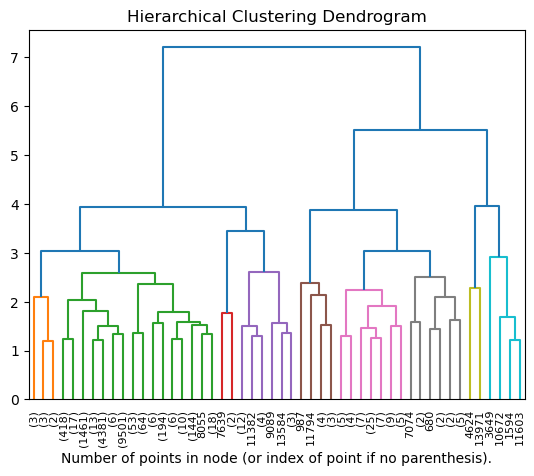

In [33]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(com_model, truncate_mode= 'lastp', p= 50 ,color_threshold=3) #definingcol threshold
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()
#creating n cl, the rest are noises
#if no parentheses -> noise point creating a cl all alone
#questo è il dend completo, dove sono plottati tutti i dsti, 
#mentre per vedere solo una certs soglia dobbiamo cambiare il parametro truncate mode

In [34]:
# get the labels according to a specific threshold value cut
#we have to choose cls according to dendog. then cut then we have labels
Z = get_linkage_matrix(com_model) #model is the initialized aggcl
labelsc = fcluster(Z, t=0.7, criterion='distance')
#t is thershold of the labels

In [35]:
# Conta i cluster e i punti per ciascun cluster
unique_labels, counts = np.unique(labelsc, return_counts=True)

# Visualizza i risultati
for label, count in zip(unique_labels, counts):
    print(f"Cluster {label}: {count} punti")

Cluster 1: 3 punti
Cluster 2: 3 punti
Cluster 3: 1 punti
Cluster 4: 1 punti
Cluster 5: 108 punti
Cluster 6: 310 punti
Cluster 7: 5 punti
Cluster 8: 12 punti
Cluster 9: 7 punti
Cluster 10: 25 punti
Cluster 11: 674 punti
Cluster 12: 21 punti
Cluster 13: 734 punti
Cluster 14: 2 punti
Cluster 15: 11 punti
Cluster 16: 43 punti
Cluster 17: 451 punti
Cluster 18: 39 punti
Cluster 19: 3848 punti
Cluster 20: 3 punti
Cluster 21: 3 punti
Cluster 22: 118 punti
Cluster 23: 193 punti
Cluster 24: 50 punti
Cluster 25: 3232 punti
Cluster 26: 34 punti
Cluster 27: 5 punti
Cluster 28: 2979 punti
Cluster 29: 344 punti
Cluster 30: 7 punti
Cluster 31: 2539 punti
Cluster 32: 4 punti
Cluster 33: 12 punti
Cluster 34: 6 punti
Cluster 35: 31 punti
Cluster 36: 6 punti
Cluster 37: 6 punti
Cluster 38: 5 punti
Cluster 39: 12 punti
Cluster 40: 30 punti
Cluster 41: 5 punti
Cluster 42: 2 punti
Cluster 43: 4 punti
Cluster 44: 3 punti
Cluster 45: 2 punti
Cluster 46: 11 punti
Cluster 47: 22 punti
Cluster 48: 14 punti
Cluste

In [37]:
print('Silhouette', silhouette_score(X_minmax, labelsc))

Silhouette 0.21220756459348197


<h2> CONFRONTO </h2>

In [40]:
com_model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='manhattan', linkage='complete')
com_model = com_model.fit(X_minmax)

sin_model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='manhattan', linkage='single')
sin_model = sin_model.fit(X_minmax)

avg_model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, 
                                metric='manhattan', linkage='average')
avg_model = avg_model.fit(X_minmax)



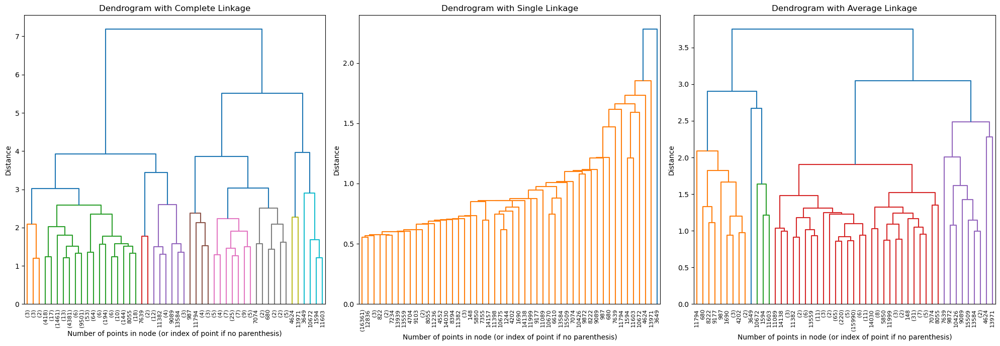

In [50]:
# Creiamo 4 subplots affiancati (1 riga, 3 colonne)
fig, axes = plt.subplots(1, 3, figsize=(20, 7))  # 1 riga, 3 colonne

# Dendrogramma 1 - Complete Linkage
axes[0].set_title("Dendrogram with Complete Linkage")
plot_dendrogram(
    com_model, 
    ax=axes[0], 
    truncate_mode='lastp',  # Trunca per mostrare ultimi cluster
    p=50,  # Mostra solo gli ultimi 50 cluster
    color_threshold=3
)
axes[0].set_xlabel("Number of points in node (or index of point if no parenthesis)")
axes[0].set_ylabel("Distance")

# Dendrogramma 2 - Single Linkage
axes[1].set_title("Dendrogram with Single Linkage")
plot_dendrogram(
    sin_model, 
    ax=axes[1], 
    truncate_mode='lastp',  # Trunca per mostrare ultimi cluster
    p=50,  # Mostra solo gli ultimi 50 cluster
    color_threshold=2
)
axes[1].set_xlabel("Number of points in node (or index of point if no parenthesis)")
axes[1].set_ylabel("Distance")
# Dendrogramma 3 - Average Linkage
axes[2].set_title("Dendrogram with Average Linkage")
plot_dendrogram(
    avg_model, 
    ax=axes[2], 
    truncate_mode='lastp',  # Trunca per mostrare ultimi cluster
    p=50,  # Mostra solo gli ultimi 50 cluster
    color_threshold=2.5
)
axes[2].set_xlabel("Number of points in node (or index of point if no parenthesis)")
axes[2].set_ylabel("Distance")



# Regola il layout per evitare sovrapposizioni
plt.tight_layout()
plt.savefig('hierarchical_clustering_dendrograms_manhattan.png', dpi=300, bbox_inches='tight')
plt.show()